# Import library 


In [129]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.graph_objs as go
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud

#Model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
#Time Series
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import multiprocessing
from joblib import Parallel, delayed
from sklearn.model_selection import TimeSeriesSplit

from itertools import product

# Read Data

In [130]:

# Specify the file path
file_path = "masked_kiva_loans.csv"

# Read the CSV file into a DataFrame
loans_data = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(loans_data.head())



        id  funded_amount  loan_amount       sector      country  partner_id  \
0  1242201            500          500  Agriculture     Pakistan       245.0   
1  1165778            325          325  Agriculture  Philippines       145.0   
2  1123052            800          800  Agriculture      Ecuador       159.0   
3  1312344            425          425  Agriculture  Philippines       136.0   
4   861422            275          275  Agriculture        Kenya       133.0   

   term_in_months  lender_count borrower_genders repayment_interval  \
0              14            14           female            monthly   
1              14            13           female          irregular   
2              14            29           female             bullet   
3               8             1           female          irregular   
4              12            11           female            monthly   

         date  
0   2/20/2017  
1  10/11/2016  
2   7/25/2016  
3    6/2/2017  
4   3/25/201

# Descripe Data

In [131]:
# Step 2: Display basic information about the DataFrame
print("Shape of the DataFrame:")
print(loans_data.shape)
print("\nColumns in the DataFrame:")
print(loans_data.columns)
print("\nData types of columns:")
print(loans_data.dtypes)



Shape of the DataFrame:
(33561, 11)

Columns in the DataFrame:
Index(['id', 'funded_amount', 'loan_amount', 'sector', 'country', 'partner_id',
       'term_in_months', 'lender_count', 'borrower_genders',
       'repayment_interval', 'date'],
      dtype='object')

Data types of columns:
id                      int64
funded_amount           int64
loan_amount             int64
sector                 object
country                object
partner_id            float64
term_in_months          int64
lender_count            int64
borrower_genders       object
repayment_interval     object
date                   object
dtype: object


# Descriptive statistics

In [132]:

print("\nDescriptive Statistics:")
print(loans_data.describe())  #statistics of numerical column


Descriptive Statistics:
                 id  funded_amount   loan_amount    partner_id  \
count  3.356100e+04   33561.000000  33561.000000  32927.000000   
mean   9.931834e+05     789.871279    843.059653    177.819145   
std    1.965757e+05    1177.245363   1222.188679     93.838691   
min    6.530490e+05       0.000000     25.000000      9.000000   
25%    8.217790e+05     250.000000    275.000000    126.000000   
50%    9.945450e+05     450.000000    500.000000    145.000000   
75%    1.164156e+06     900.000000    975.000000    204.000000   
max    1.340239e+06   50000.000000  50000.000000    533.000000   

       term_in_months  lender_count  
count    33561.000000  33561.000000  
mean        13.691428     20.549179  
std          8.566574     28.514324  
min          1.000000      0.000000  
25%          8.000000      7.000000  
50%         13.000000     13.000000  
75%         14.000000     24.000000  
max        145.000000   1481.000000  


# Analysis Data

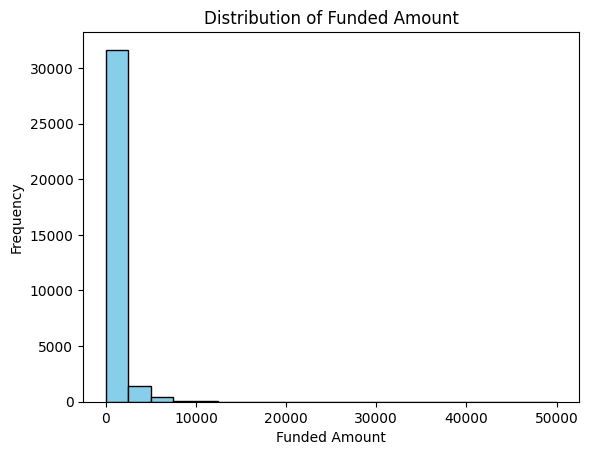

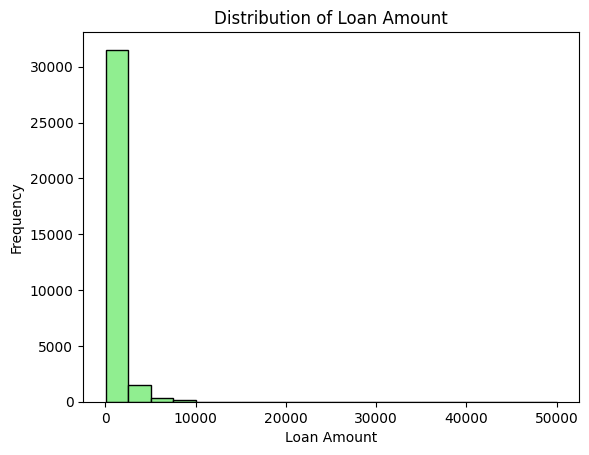

In [133]:
# Visualize distribution of 'funded_amount' using a histogram
plt.hist(loans_data['funded_amount'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Funded Amount')
plt.xlabel('Funded Amount')
plt.ylabel('Frequency')
plt.show()

# Visualize distribution of 'loan_amount' using a histogram
plt.hist(loans_data['loan_amount'], bins=20, color='lightgreen', edgecolor='black')
plt.title('Distribution of Loan Amount')
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')
plt.show()


In [134]:
# Calculate summary statistics for 'funded_amount' and 'loan_amount'
funded_amount_stats = loans_data['funded_amount'].describe()
loan_amount_stats = loans_data['loan_amount'].describe()

print("Summary Statistics for Funded Amount:")
print(funded_amount_stats)
print("\nSummary Statistics for Loan Amount:")
print(loan_amount_stats)


Summary Statistics for Funded Amount:
count    33561.000000
mean       789.871279
std       1177.245363
min          0.000000
25%        250.000000
50%        450.000000
75%        900.000000
max      50000.000000
Name: funded_amount, dtype: float64

Summary Statistics for Loan Amount:
count    33561.000000
mean       843.059653
std       1222.188679
min         25.000000
25%        275.000000
50%        500.000000
75%        975.000000
max      50000.000000
Name: loan_amount, dtype: float64


In [135]:
term_in_months_counts=loans_data["term_in_months"].describe()
print("Summary Statistics for Term in month:")
term_in_months_counts

Summary Statistics for Term in month:


count    33561.000000
mean        13.691428
std          8.566574
min          1.000000
25%          8.000000
50%         13.000000
75%         14.000000
max        145.000000
Name: term_in_months, dtype: float64

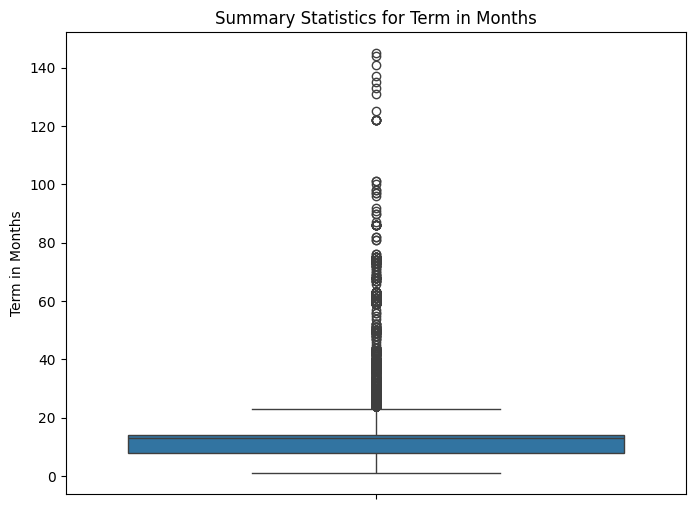

In [136]:

# Box plot for term in months
plt.figure(figsize=(8, 6))
sns.boxplot(data=loans_data, y='term_in_months')
plt.title('Summary Statistics for Term in Months')
plt.ylabel('Term in Months')

plt.show()



In [137]:
loans_data.describe(include="object") 


,sector,country,borrower_genders,repayment_interval,date
count,33561,33561,33366,33561,33561
unique,15,79,1032,4,1284
top,Agriculture,Philippines,female,monthly,11/18/2016
freq,9015,8096,21264,17237,74


In [138]:
# Calculate frequency count for 'sector' and 'country'
sector_counts = loans_data['sector'].value_counts()
country_counts = loans_data['country'].value_counts()

print("Frequency Count for Sector:")
print(sector_counts)
print("\nFrequency Count for Country:")
print(country_counts)



Frequency Count for Sector:
sector
Agriculture       9015
Food              6833
Retail            6225
Services          2257
Personal Use      1819
Housing           1687
Clothing          1637
Education         1551
Transportation     776
Arts               603
Health             461
Construction       313
Manufacturing      310
Entertainment       42
Wholesale           32
Name: count, dtype: int64

Frequency Count for Country:
country
Philippines                             8096
Kenya                                   3814
El Salvador                             1972
Cambodia                                1757
Pakistan                                1389
Peru                                    1108
Colombia                                1086
Uganda                                  1026
Tajikistan                               976
Ecuador                                  639
Paraguay                                 605
Nicaragua                                562
India           

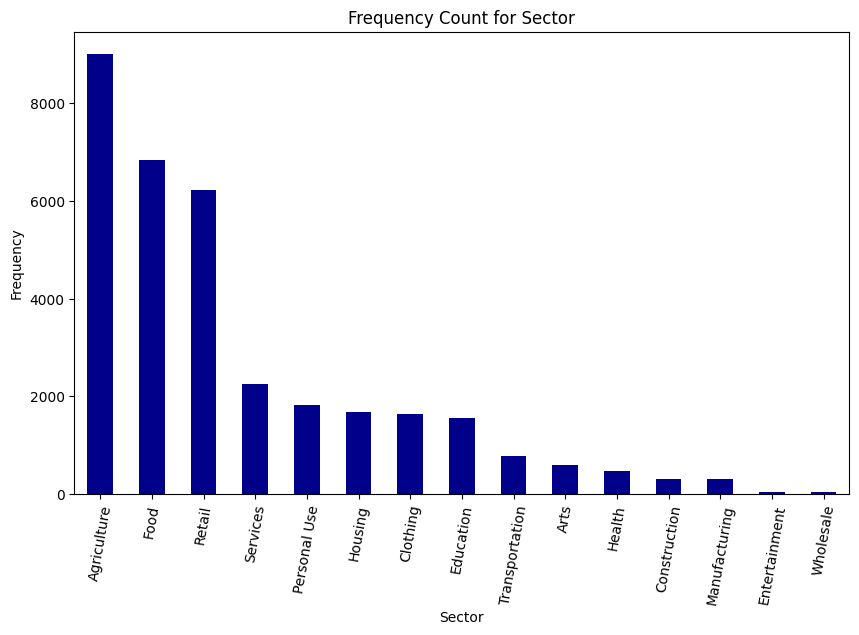

In [139]:

# Visualize frequency count for sector
plt.figure(figsize=(10,6))
sector_counts.plot(kind='bar', color='darkBlue')
plt.title('Frequency Count for Sector')
plt.xlabel('Sector')
plt.ylabel('Frequency')
plt.xticks(rotation=80)
plt.show()


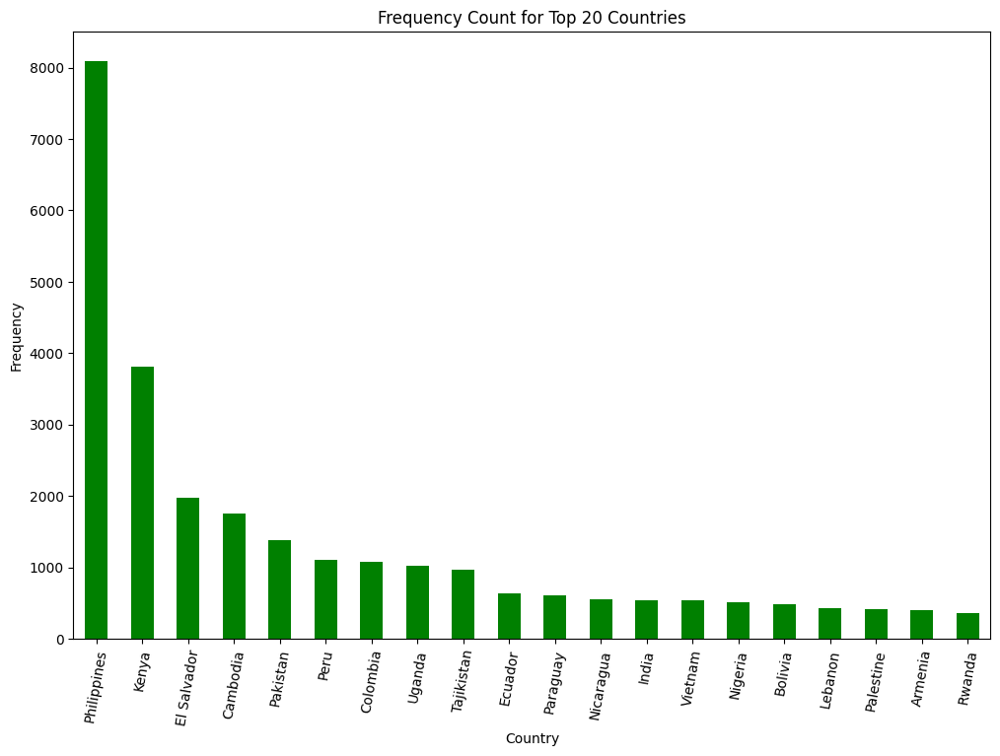

In [140]:

# Visualize frequency count for country
plt.figure(figsize=(12, 8))
country_counts[:20].plot(kind='bar', color='green')
plt.title('Frequency Count for Top 20 Countries')
plt.xlabel('Country')
plt.ylabel('Frequency')
plt.xticks(rotation=80)
plt.show()



In [141]:
repayment_interval_counts	=loans_data['repayment_interval'].value_counts()


print("Frequency Count for Repayment Interval :")
print(repayment_interval_counts)

Frequency Count for Repayment Interval :
repayment_interval
monthly      17237
irregular    12769
bullet        3525
weekly          30
Name: count, dtype: int64


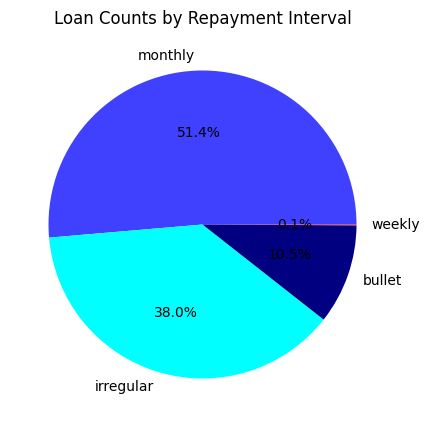

In [142]:
# # Pie chart of loan counts by repayment interval
plt.figure(figsize=(5, 5))
# Data
repayment_interval_counts = loans_data['repayment_interval'].value_counts()
# Define custom colors for the pie chart
custom_colors = ['#4040FF', '#00FFFF', '#000080', '#d62728']

# Create the pie chart with custom colors
plt.pie(repayment_interval_counts, labels=repayment_interval_counts.index, autopct='%1.1f%%', colors=custom_colors)
plt.title('Loan Counts by Repayment Interval')
plt.show()


In [143]:
loans_added = loans_data.groupby("date")[["id"]].count()
print(loans_added[1:20])



           id
date         
1/1/2015    5
1/1/2016    1
1/10/2014  10
1/10/2015  15
1/10/2016   4
1/10/2017  32
1/11/2014   3
1/11/2015   4
1/11/2016  26
1/11/2017  22
1/12/2014   2
1/12/2015  32
1/12/2016  34
1/12/2017  34
1/13/2014  18
1/13/2015  14
1/13/2016  38
1/13/2017  39
1/14/2014  27


In [144]:

loans_added = loans_added.rename({"id" : "Number_of_Loans_added"} , axis = 1)


In [145]:

loans_added[1:20]

,Number_of_Loans_added
date,
1/1/2015,5
1/1/2016,1
1/10/2014,10
1/10/2015,15
1/10/2016,4
1/10/2017,32
1/11/2014,3
1/11/2015,4
1/11/2016,26


In [146]:
loans_added.index




Index(['1/1/2014', '1/1/2015', '1/1/2016', '1/10/2014', '1/10/2015',
       '1/10/2016', '1/10/2017', '1/11/2014', '1/11/2015', '1/11/2016',
       ...
       '9/6/2016', '9/7/2014', '9/7/2015', '9/7/2016', '9/8/2014', '9/8/2015',
       '9/8/2016', '9/9/2014', '9/9/2015', '9/9/2016'],
      dtype='object', name='date', length=1284)

In [147]:
loans_added.reset_index


<bound method DataFrame.reset_index of             Number_of_Loans_added
date                             
1/1/2014                        1
1/1/2015                        5
1/1/2016                        1
1/10/2014                      10
1/10/2015                      15
1/10/2016                       4
1/10/2017                      32
1/11/2014                       3
1/11/2015                       4
1/11/2016                      26
1/11/2017                      22
1/12/2014                       2
1/12/2015                      32
1/12/2016                      34
1/12/2017                      34
1/13/2014                      18
1/13/2015                      14
1/13/2016                      38
1/13/2017                      39
1/14/2014                      27
1/14/2015                      14
1/14/2016                      33
1/14/2017                       7
1/15/2014                      26
1/15/2015                      30
1/15/2016                      33
1/15/2017

In [148]:
loans_added.set_index

<bound method DataFrame.set_index of             Number_of_Loans_added
date                             
1/1/2014                        1
1/1/2015                        5
1/1/2016                        1
1/10/2014                      10
1/10/2015                      15
1/10/2016                       4
1/10/2017                      32
1/11/2014                       3
1/11/2015                       4
1/11/2016                      26
1/11/2017                      22
1/12/2014                       2
1/12/2015                      32
1/12/2016                      34
1/12/2017                      34
1/13/2014                      18
1/13/2015                      14
1/13/2016                      38
1/13/2017                      39
1/14/2014                      27
1/14/2015                      14
1/14/2016                      33
1/14/2017                       7
1/15/2014                      26
1/15/2015                      30
1/15/2016                      33
1/15/2017  

In [149]:
loans_added[1:20]

,Number_of_Loans_added
date,
1/1/2015,5
1/1/2016,1
1/10/2014,10
1/10/2015,15
1/10/2016,4
1/10/2017,32
1/11/2014,3
1/11/2015,4
1/11/2016,26


In [150]:
# Convert index to datetime 
loans_added.index = pd.to_datetime(loans_added.index)

# Add a new column 'month_name' containing the month names
loans_added['month_name'] = loans_added.index.month_name()


In [151]:
loans_added['year'] = loans_added.index.year

In [152]:
loans_added[1:20]

,Number_of_Loans_added,month_name,year
date,,,
2015-01-01,5,January,2015
2016-01-01,1,January,2016
2014-01-10,10,January,2014
2015-01-10,15,January,2015
2016-01-10,4,January,2016
2017-01-10,32,January,2017
2014-01-11,3,January,2014
2015-01-11,4,January,2015
2016-01-11,26,January,2016


In [153]:
# Count the occurrences of each year
year_counts = loans_added['year'].value_counts()

# Count the occurrences of each month
month_counts = loans_added['month_name'].value_counts()

# Find the year with the maximum count
max_year = year_counts.idxmax()
max_year_count = year_counts.max()

# Find the month with the maximum count
max_month = month_counts.idxmax()
max_month_count = month_counts.max()

# Print the results
print("Year Counts:")
print(year_counts)
print(f"Year with the most occurrences: {max_year}, Count: {max_year_count}")

print("\nMonth Counts:")
print(month_counts)
print(f"Month with the most occurrences: {max_month}, Count: {max_month_count}")



Year Counts:
year
2015    364
2014    363
2016    363
2017    194
Name: count, dtype: int64
Year with the most occurrences: 2015, Count: 364

Month Counts:
month_name
May          124
March        123
January      122
April        120
June         120
February     112
July         106
October       93
December      93
August        92
September     90
November      89
Name: count, dtype: int64
Month with the most occurrences: May, Count: 124


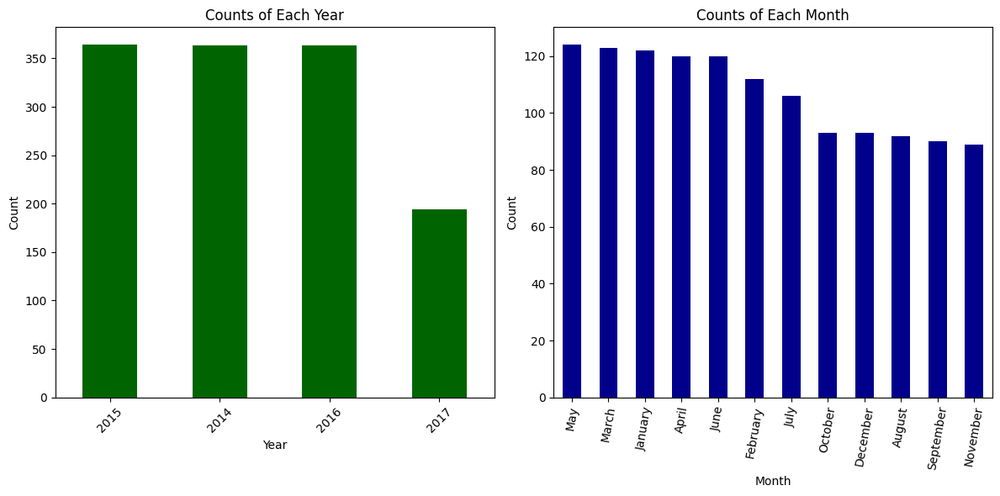

In [154]:

# Plotting
plt.figure(figsize=(12, 6))

# Bar plot for year counts
plt.subplot(1, 2, 1)
year_counts.plot(kind='bar', color='darkgreen',)
plt.title('Counts of Each Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Bar plot for month counts
plt.subplot(1, 2, 2)
month_counts.plot(kind='bar', color='darkblue')
plt.title('Counts of Each Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(rotation=80)

plt.tight_layout()
plt.show()


# DATA PREPROCESSING

In [155]:
#coping original data
df =loans_data.copy()

* Transformation data

In [156]:

# Display the data types of each column
df.dtypes


id                      int64
funded_amount           int64
loan_amount             int64
sector                 object
country                object
partner_id            float64
term_in_months          int64
lender_count            int64
borrower_genders       object
repayment_interval     object
date                   object
dtype: object

In [157]:
df['date'] = pd.to_datetime(df['date'])

# # Now,  check the data types again,'date' as datetime64[ns]
print(df.dtypes)


id                             int64
funded_amount                  int64
loan_amount                    int64
sector                        object
country                       object
partner_id                   float64
term_in_months                 int64
lender_count                   int64
borrower_genders              object
repayment_interval            object
date                  datetime64[ns]
dtype: object


In [158]:
df['date']

0       2017-02-20
1       2016-10-11
2       2016-07-25
3       2017-06-02
4       2015-03-25
5       2015-03-31
6       2016-02-17
7       2014-03-28
8       2014-08-04
9       2015-08-06
10      2014-12-05
11      2016-12-20
12      2015-05-12
13      2015-08-07
14      2016-05-26
15      2014-11-16
16      2017-06-16
17      2017-02-03
18      2017-06-19
19      2017-02-28
20      2015-03-20
21      2017-05-12
22      2014-12-03
23      2014-04-10
24      2015-02-03
25      2016-05-30
26      2017-01-24
27      2015-02-09
28      2014-12-07
29      2017-04-20
30      2014-12-12
31      2015-03-02
32      2015-09-22
33      2016-07-21
34      2017-06-28
35      2015-01-12
36      2015-05-26
37      2014-12-17
38      2016-02-13
39      2017-04-13
40      2015-09-04
41      2017-05-11
42      2015-02-23
43      2016-03-31
44      2016-02-10
45      2014-03-10
46      2016-06-14
47      2017-03-22
48      2017-04-11
49      2017-04-18
50      2014-03-27
51      2016-05-18
52      2015

In [159]:
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

In [160]:
#Convert datetime to Unix timestamp using timestamp() method
df['timestamp'] = df['date'].apply(lambda x: x.timestamp()).astype('int64')


df.head()


,id,funded_amount,loan_amount,sector,country,partner_id,term_in_months,lender_count,borrower_genders,repayment_interval,date,year,month,day,timestamp
0,1242201,500,500,Agriculture,Pakistan,245.0,14,14,female,monthly,2017-02-20,2017,2,20,1487548800
1,1165778,325,325,Agriculture,Philippines,145.0,14,13,female,irregular,2016-10-11,2016,10,11,1476144000
2,1123052,800,800,Agriculture,Ecuador,159.0,14,29,female,bullet,2016-07-25,2016,7,25,1469404800
3,1312344,425,425,Agriculture,Philippines,136.0,8,1,female,irregular,2017-06-02,2017,6,2,1496361600
4,861422,275,275,Agriculture,Kenya,133.0,12,11,female,monthly,2015-03-25,2015,3,25,1427241600


In [161]:
# Dropping columns Not necessary
# Transformation Methods Applied
df.drop(["partner_id","borrower_genders"], axis = 1, inplace = True)

In [162]:
df.head()


,id,funded_amount,loan_amount,sector,country,term_in_months,lender_count,repayment_interval,date,year,month,day,timestamp
0,1242201,500,500,Agriculture,Pakistan,14,14,monthly,2017-02-20,2017,2,20,1487548800
1,1165778,325,325,Agriculture,Philippines,14,13,irregular,2016-10-11,2016,10,11,1476144000
2,1123052,800,800,Agriculture,Ecuador,14,29,bullet,2016-07-25,2016,7,25,1469404800
3,1312344,425,425,Agriculture,Philippines,8,1,irregular,2017-06-02,2017,6,2,1496361600
4,861422,275,275,Agriculture,Kenya,12,11,monthly,2015-03-25,2015,3,25,1427241600


* Data Cleaning

In [163]:
#Examining Missing Values
# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
isnull_number = []
for i in df.columns:
    x = df[i].isnull().sum()
    isnull_number.append(x)

pd.DataFrame(isnull_number, index = df.columns, columns = ["Total Missing Values"])

,Total Missing Values
id,0
funded_amount,0
loan_amount,0
sector,0
country,0
term_in_months,0
lender_count,0
repayment_interval,0
date,0
year,0


In [164]:
df.shape
loans_data.shape

(33561, 11)

In [165]:
# Check for duplicated rows in the DataFrame
duplicate_rows = df[df.duplicated()]

# Print the duplicated rows
if not duplicate_rows.empty:
    print("Duplicated rows:")
    print(duplicate_rows)
else:
    print("No duplicated rows found.")



No duplicated rows found.


In [166]:
categorical_data = df.select_dtypes(include = ['object']).columns
print("categorical data column names:")
print(categorical_data)

categorical data column names:
Index(['sector', 'country', 'repayment_interval'], dtype='object')


In [167]:
numerical_data = df.select_dtypes(exclude = ['object']).columns
print("Numerical data column names:")
print(numerical_data)

Numerical data column names:
Index(['id', 'funded_amount', 'loan_amount', 'term_in_months', 'lender_count',
       'date', 'year', 'month', 'day', 'timestamp'],
      dtype='object')


In [168]:
df.head()

,id,funded_amount,loan_amount,sector,country,term_in_months,lender_count,repayment_interval,date,year,month,day,timestamp
0,1242201,500,500,Agriculture,Pakistan,14,14,monthly,2017-02-20,2017,2,20,1487548800
1,1165778,325,325,Agriculture,Philippines,14,13,irregular,2016-10-11,2016,10,11,1476144000
2,1123052,800,800,Agriculture,Ecuador,14,29,bullet,2016-07-25,2016,7,25,1469404800
3,1312344,425,425,Agriculture,Philippines,8,1,irregular,2017-06-02,2017,6,2,1496361600
4,861422,275,275,Agriculture,Kenya,12,11,monthly,2015-03-25,2015,3,25,1427241600


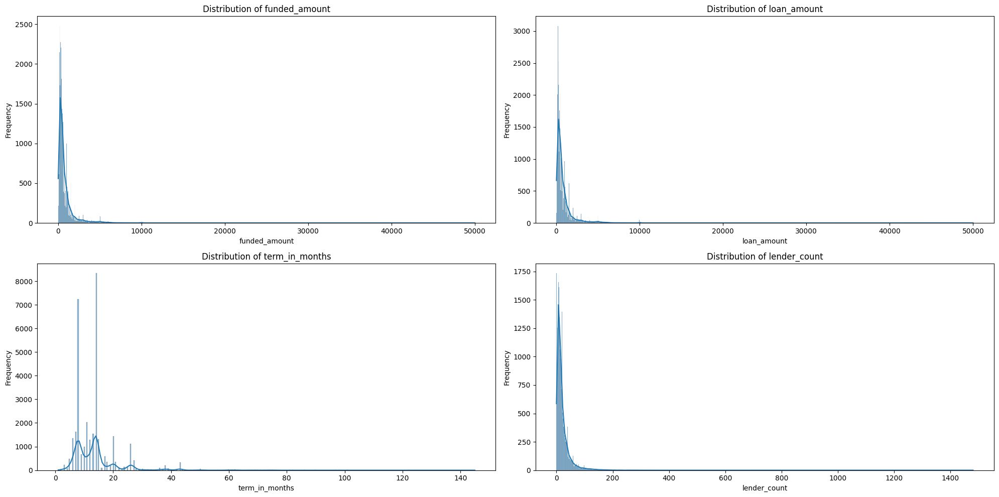

In [169]:

# Define the numerical columns to plot
numerical_columns = ['funded_amount', 'loan_amount', 'term_in_months', 'lender_count']

# Set up the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

# Loop through each numerical column and plot its distribution in a separate subplot
for ax, column in zip(axes.flatten(), numerical_columns):
    sns.histplot(df[column], ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()




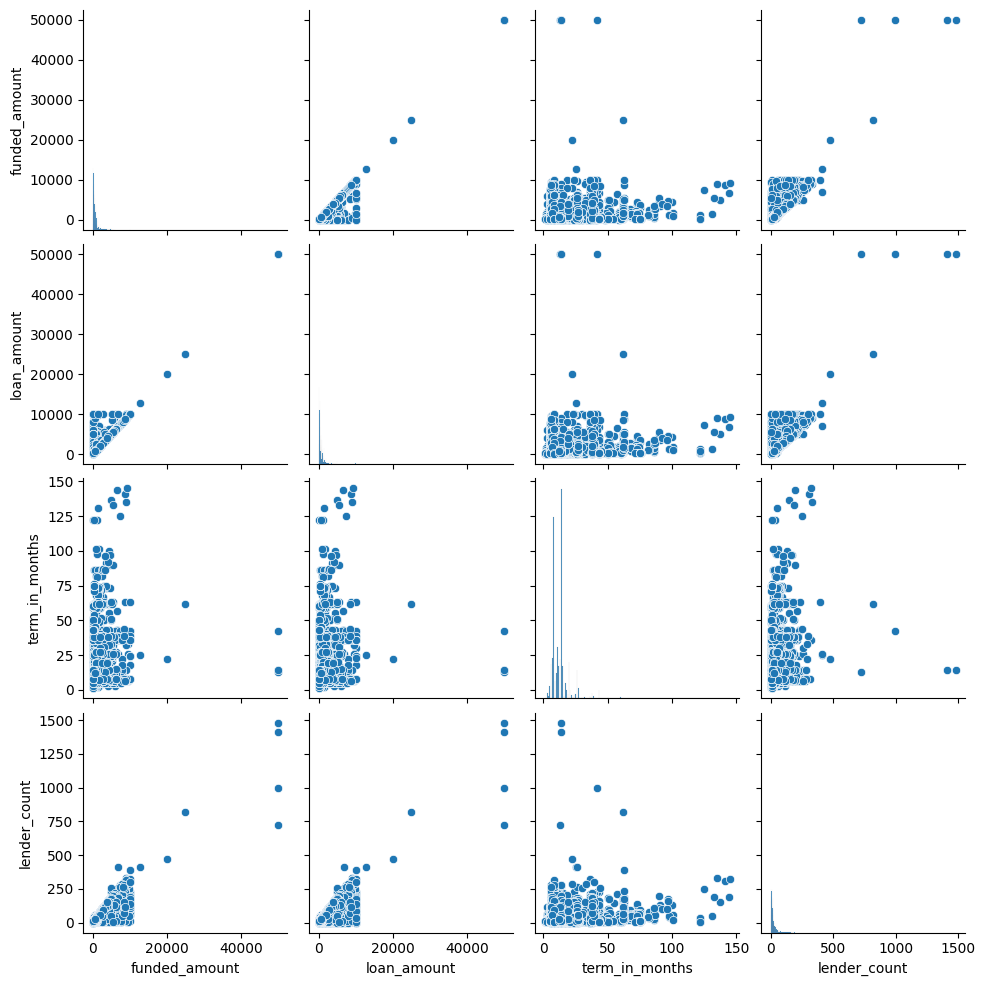

In [170]:
sns.pairplot(df[numerical_columns])
plt.show()

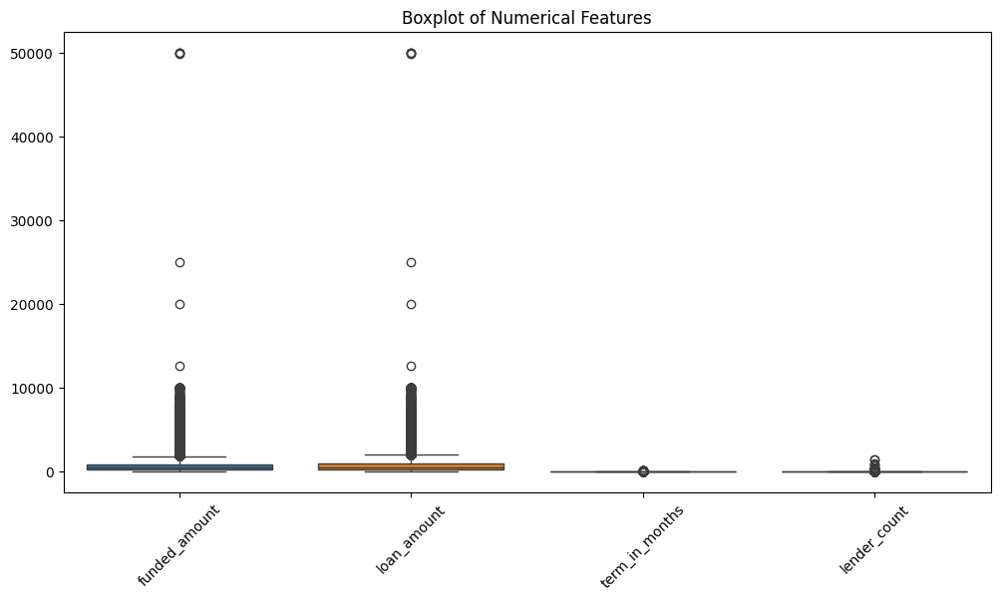

In [171]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numerical_columns])
plt.title('Boxplot of Numerical Features')
plt.xticks(rotation=45)
plt.show()

In [172]:
# Function to remove outliers using IQR method for specific columns
def remove_outliers_iqr_column(data, columns):
    # Iterate over each column and remove outliers using IQR method
    for column in columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        data[column] = data[column][(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Assuming 'df' is a DataFrame containing numerical features

cleaned_df_Remove_Outlier = remove_outliers_iqr_column(df.copy(), numerical_columns)

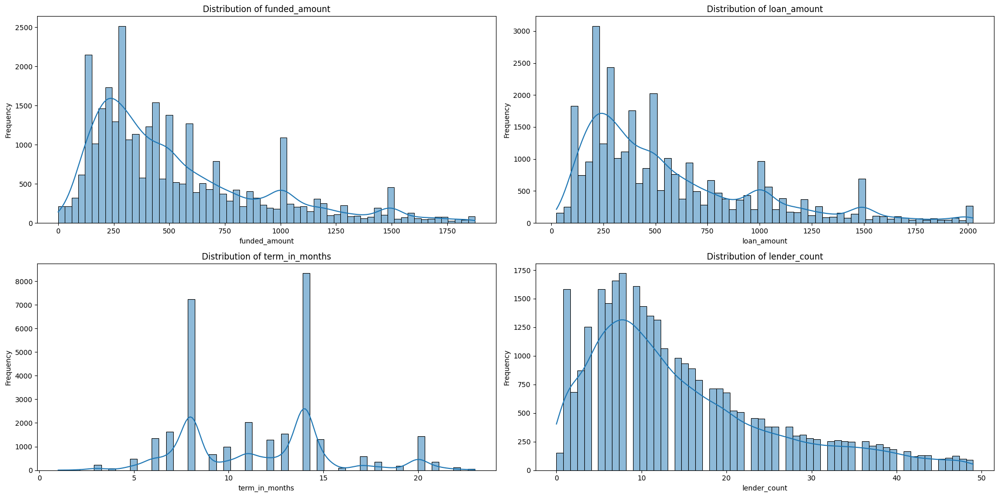

In [173]:

# Set up the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

# Loop through each numerical column and plot its distribution in a separate subplot
for ax, column in zip(axes.flatten(), numerical_columns):
    sns.histplot(cleaned_df_Remove_Outlier[column], ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [174]:
#Examining Missing Values
# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
isnull_number = []
for i in cleaned_df_Remove_Outlier.columns:
    x = cleaned_df_Remove_Outlier[i].isnull().sum()
    isnull_number.append(x)

pd.DataFrame(isnull_number, index = cleaned_df_Remove_Outlier.columns, columns = ["Total Missing Values"])

,Total Missing Values
id,0
funded_amount,2790
loan_amount,2654
sector,0
country,0
term_in_months,3187
lender_count,2724
repayment_interval,0
date,0
year,0


In [175]:
# Drop rows with NaN values in 'funded_amount', 'loan_amount', 'term_in_months', and 'lender_count' columns
cleaned_dff = cleaned_df_Remove_Outlier.dropna(subset=['funded_amount', 'loan_amount', 'term_in_months', 'lender_count'])

# Check the shape of the dataframe after dropping NaN values
print("Shape of dataframe before dropping rows with NaN values:", cleaned_df_Remove_Outlier.shape)
print("Shape of dataframe after dropping rows with NaN values:", cleaned_dff.shape)



Shape of dataframe before dropping rows with NaN values: (33561, 13)
Shape of dataframe after dropping rows with NaN values: (27642, 13)


In [176]:
#Examining Missing Values
# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
isnull_number = []
for i in cleaned_dff.columns:
    x = cleaned_dff[i].isnull().sum()
    isnull_number.append(x)

pd.DataFrame(isnull_number, index = cleaned_dff.columns, columns = ["Total Missing Values"])

,Total Missing Values
id,0
funded_amount,0
loan_amount,0
sector,0
country,0
term_in_months,0
lender_count,0
repayment_interval,0
date,0
year,0


remove outliers using trimming method

In [177]:

# Function to remove outliers using trimming method for specific columns
def remove_outliers_trim_column(data, columns, lower_percentile=5, upper_percentile=95):
    # Iterate over each column and remove outliers using trimming method
    for column in columns:
        lower_threshold = np.percentile(data[column], lower_percentile)
        upper_threshold = np.percentile(data[column], upper_percentile)
        data = data[(data[column] >= lower_threshold) & (data[column] <= upper_threshold)]
    return data


cleaned_df = remove_outliers_trim_column(df.copy(), numerical_columns)

# Check the shape of the dataframe after removing outliers
print("Shape of dataframe before removing outliers:", df.shape)

print("Shape of dataframe after removing outliers:", cleaned_df.shape)




Shape of dataframe before removing outliers: (33561, 13)
Shape of dataframe after removing outliers: (23046, 13)


In [178]:
null_counts = cleaned_df.isnull().sum()
null_counts

id                    0
funded_amount         0
loan_amount           0
sector                0
country               0
term_in_months        0
lender_count          0
repayment_interval    0
date                  0
year                  0
month                 0
day                   0
timestamp             0
dtype: int64

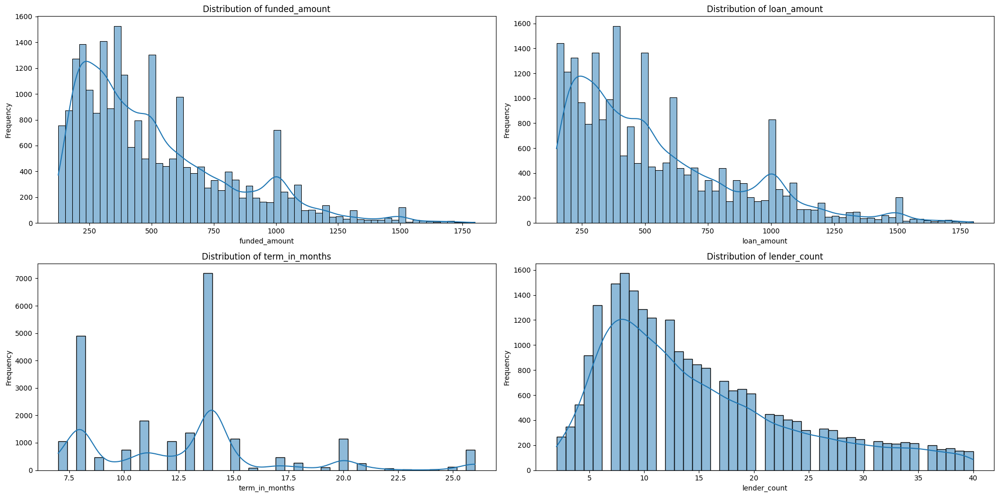

In [179]:

# Set up the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

# Loop through each numerical column and plot its distribution in a separate subplot
for ax, column in zip(axes.flatten(), numerical_columns):
    sns.histplot(cleaned_df[column], ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


Winsorization as a technique used to handle outliers in a dataset.

In [180]:
# Function to perform Winsorization on specific columns
def winsorize_column(data, columns, lower_percentile=5, upper_percentile=95):
    # Iterate over each column and apply Winsorization
    for column in columns:
        lower_threshold = np.percentile(data[column], lower_percentile)
        upper_threshold = np.percentile(data[column], upper_percentile)
        data[column] = np.where(data[column] < lower_threshold, lower_threshold, data[column])
        data[column] = np.where(data[column] > upper_threshold, upper_threshold, data[column])
    return data


columns_to_winsorize = ['funded_amount', 'loan_amount', 'term_in_months', 'lender_count']
winsorized_df = winsorize_column(df.copy(), columns_to_winsorize)

# Check the dataframe after Winsorization
print("Winsorized DataFrame:")
print(winsorized_df)


Winsorized DataFrame:
            id  funded_amount  loan_amount          sector  \
0      1242201          500.0        500.0     Agriculture   
1      1165778          325.0        325.0     Agriculture   
2      1123052          800.0        800.0     Agriculture   
3      1312344          425.0        425.0     Agriculture   
4       861422          275.0        275.0     Agriculture   
5       864504          350.0        350.0     Agriculture   
6      1023952          200.0        200.0     Agriculture   
7       690323          575.0        575.0     Agriculture   
8       749263          325.0        325.0     Agriculture   
9       928716          500.0        500.0     Agriculture   
10      811089          400.0        400.0     Agriculture   
11     1206990          775.0        775.0     Agriculture   
12      884022          625.0        625.0     Agriculture   
13      928991          225.0        225.0     Agriculture   
14     1076241          425.0       1000.0     A

In [181]:
#Examining Missing Values
# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
isnull_number = []
for i in winsorized_df.columns:
    x = winsorized_df[i].isnull().sum()
    isnull_number.append(x)

pd.DataFrame(isnull_number, index = winsorized_df.columns, columns = ["Total Missing Values"])

,Total Missing Values
id,0
funded_amount,0
loan_amount,0
sector,0
country,0
term_in_months,0
lender_count,0
repayment_interval,0
date,0
year,0


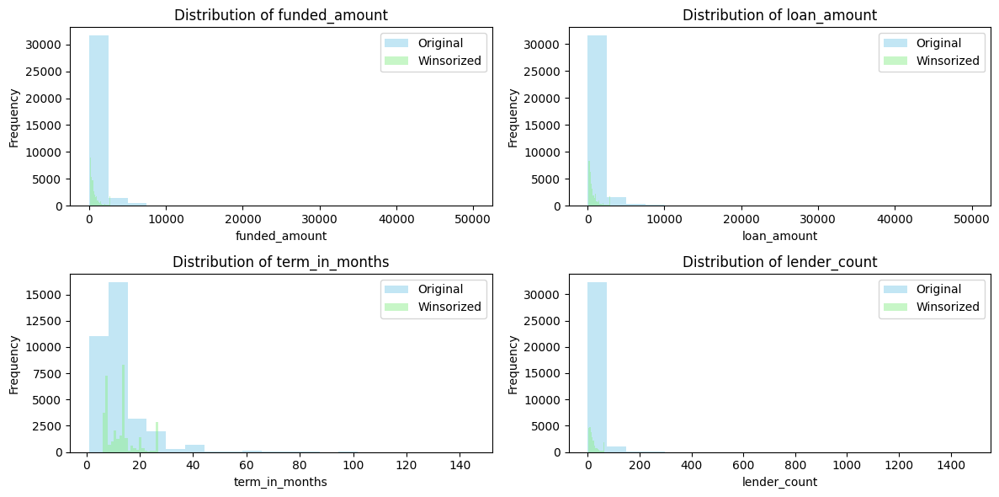

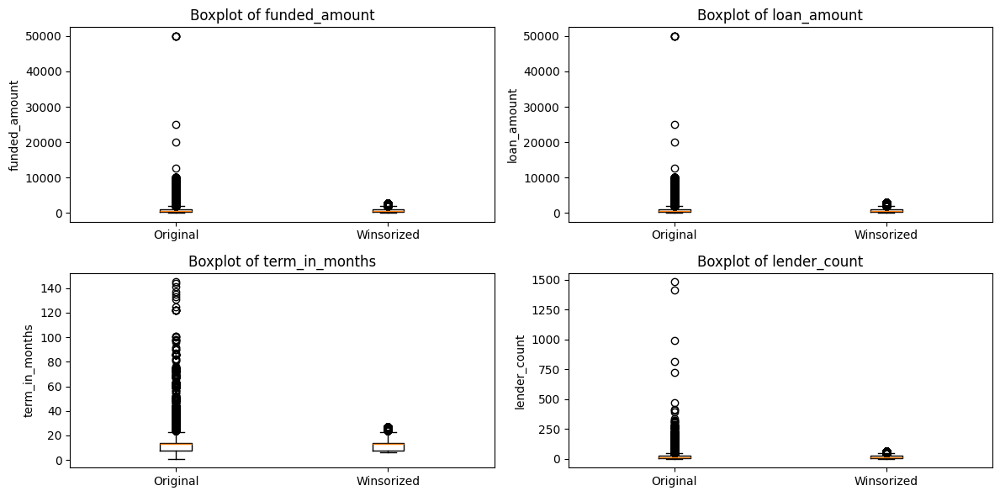

In [182]:
# Visualize the distributions of numerical features using histograms
plt.figure(figsize=(12, 6))
for i, feature in enumerate(columns_to_winsorize):
    plt.subplot(2, 2, i+1)
    plt.hist(df[feature], bins=20, color='skyblue', alpha=0.5, label='Original')
    plt.hist(winsorized_df[feature], bins=20, color='lightgreen', alpha=0.5, label='Winsorized')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
plt.tight_layout()
plt.show()

# Visualize the distributions of numerical features using boxplots
plt.figure(figsize=(12, 6))
for i, feature in enumerate(numerical_columns):
    plt.subplot(2, 2, i+1)
    plt.boxplot([df[feature], winsorized_df[feature]], labels=['Original', 'Winsorized'])
    plt.title(f'Boxplot of {feature}')
    plt.ylabel(feature)
plt.tight_layout()
plt.show()


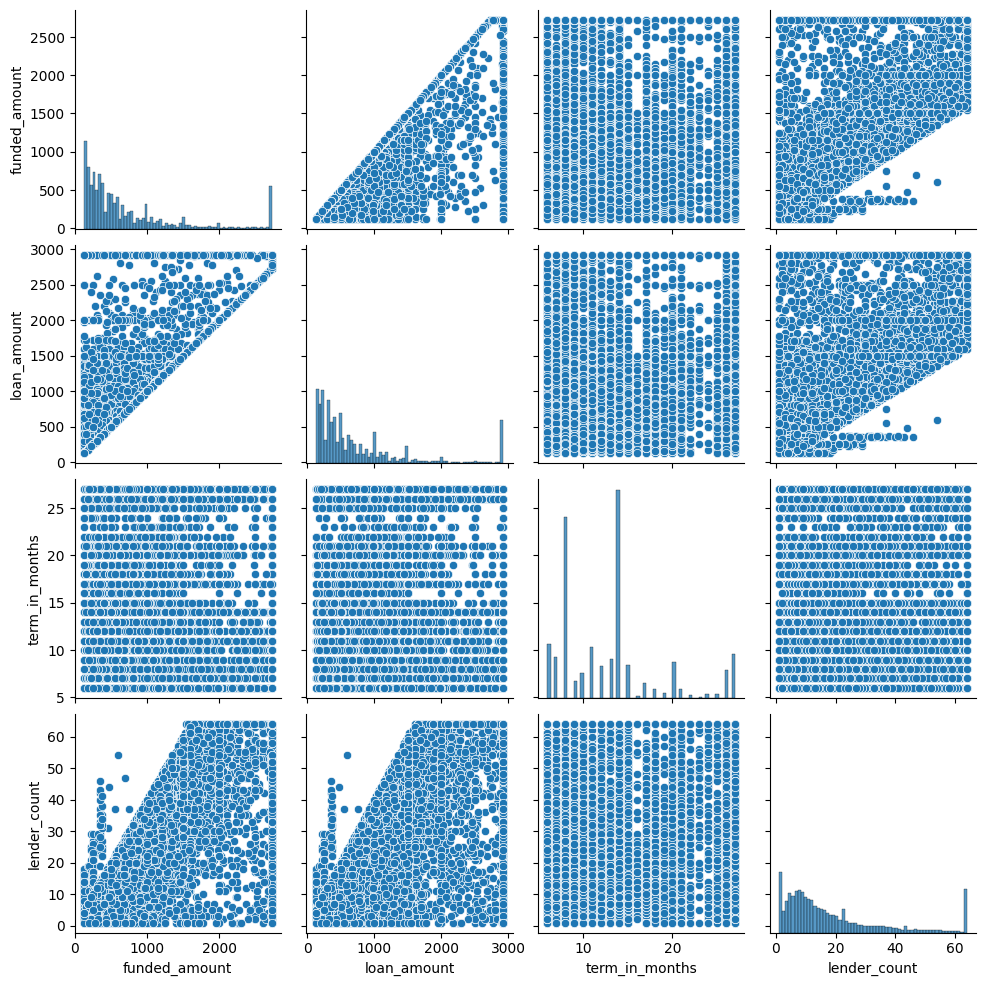

In [183]:
sns.pairplot(winsorized_df[numerical_columns])
plt.show()

In [184]:
null_counts = winsorized_df.isnull().sum()
null_counts

id                    0
funded_amount         0
loan_amount           0
sector                0
country               0
term_in_months        0
lender_count          0
repayment_interval    0
date                  0
year                  0
month                 0
day                   0
timestamp             0
dtype: int64

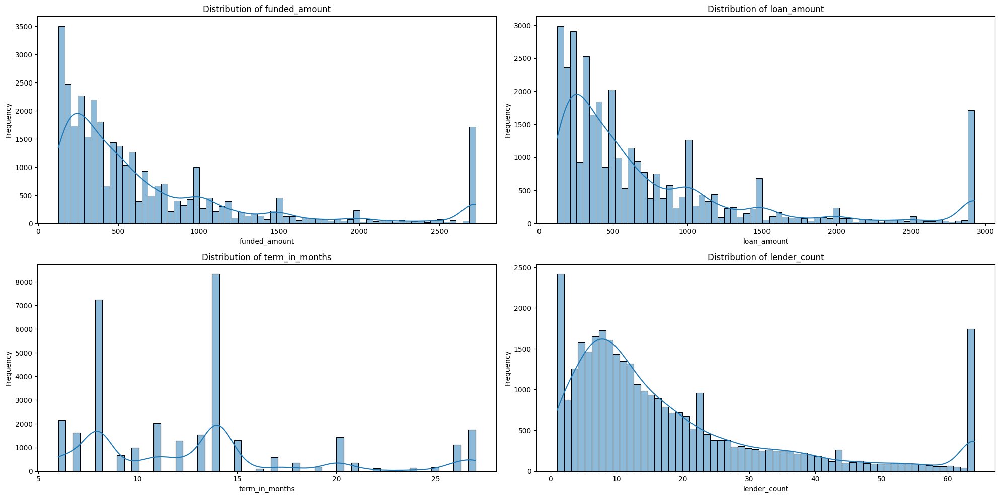

In [185]:

# Set up the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

# Loop through each numerical column and plot its distribution in a separate subplot
for ax, column in zip(axes.flatten(), numerical_columns):
    sns.histplot(winsorized_df[column], ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [186]:
winsorized_df.head(3)

,id,funded_amount,loan_amount,sector,country,term_in_months,lender_count,repayment_interval,date,year,month,day,timestamp
0,1242201,500.0,500.0,Agriculture,Pakistan,14.0,14.0,monthly,2017-02-20,2017,2,20,1487548800
1,1165778,325.0,325.0,Agriculture,Philippines,14.0,13.0,irregular,2016-10-11,2016,10,11,1476144000
2,1123052,800.0,800.0,Agriculture,Ecuador,14.0,29.0,bullet,2016-07-25,2016,7,25,1469404800


Save data in file csv to work i PowerBi


In [187]:

winsorized_df.to_csv('data.csv', index=False)  # Set index=False to exclude row numbers in the CSV file


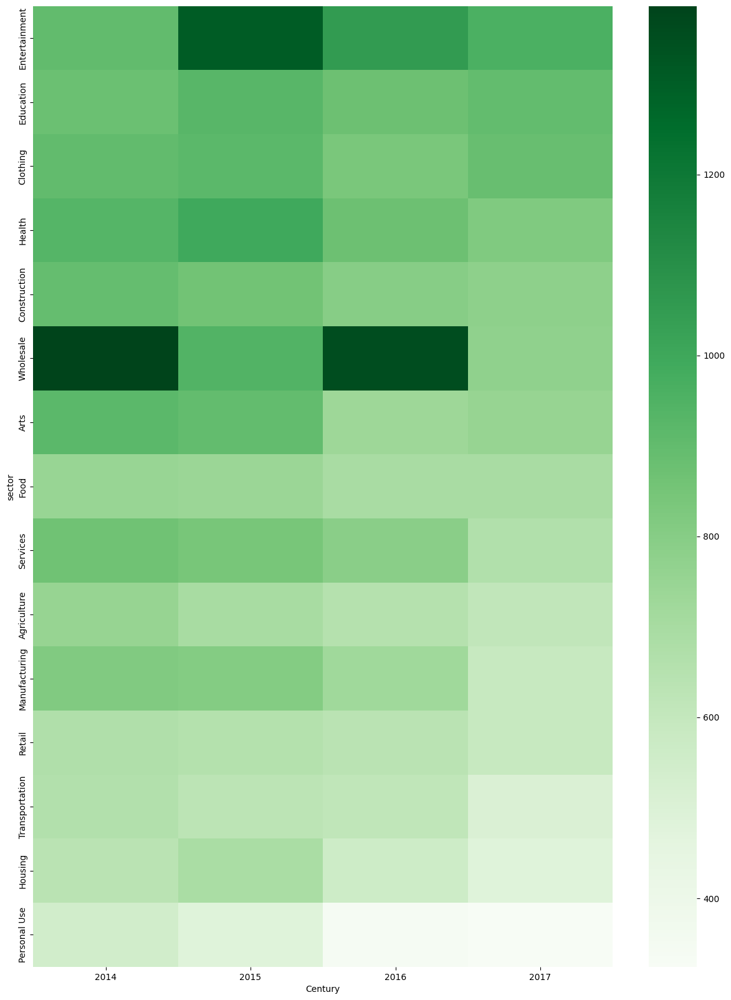

In [188]:
winsorized_df['Century'] = winsorized_df.date.dt.year
loan = winsorized_df.groupby(['sector', 'Century'])['funded_amount'].mean().unstack()
loan = loan.sort_values([2017], ascending=False)
f, ax = plt.subplots(figsize=(15, 20)) 
loan = loan.fillna(0)
temp = sns.heatmap(loan, cmap='Greens')
plt.show()

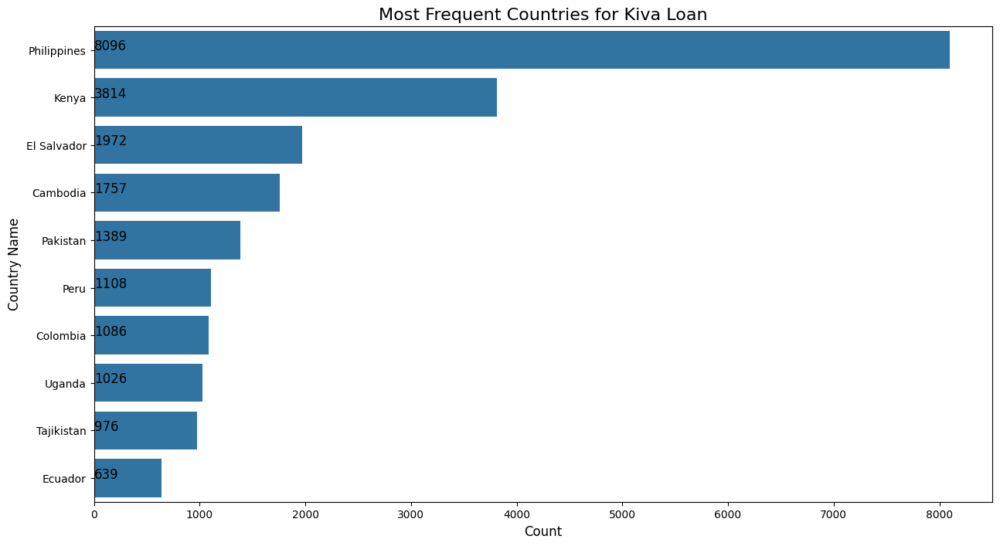

In [189]:

plt.figure(figsize=(15, 8))
count = winsorized_df['country'].value_counts().head(10)
sns.barplot(x=count.values, y=count.index)
for i, v in enumerate(count.values):
    plt.text(0.8, i, v, color='k', fontsize=12)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Country Name', fontsize=12)
plt.title("Most Frequent Countries for Kiva Loan", fontsize=16)
plt.show()


Dummy Variables


In [190]:

le=LabelEncoder()
Cleaned_df_final=pd.get_dummies(winsorized_df,columns=["sector",'country'])
Cleaned_df_final['repayment_interval']=le.fit_transform(Cleaned_df_final['repayment_interval'])







In [191]:
Cleaned_df_final.head()

,id,funded_amount,loan_amount,term_in_months,lender_count,repayment_interval,date,year,month,day,timestamp,Century,sector_Agriculture,sector_Arts,sector_Clothing,sector_Construction,sector_Education,sector_Entertainment,sector_Food,sector_Health,sector_Housing,sector_Manufacturing,sector_Personal Use,sector_Retail,sector_Services,sector_Transportation,sector_Wholesale,country_Albania,country_Armenia,country_Azerbaijan,country_Belize,country_Benin,country_Bolivia,country_Brazil,country_Burkina Faso,country_Burundi,country_Cambodia,country_Cameroon,country_Chile,country_China,country_Colombia,country_Congo,country_Costa Rica,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Georgia,country_Ghana,country_Guatemala,country_Haiti,country_Honduras,country_India,country_Indonesia,country_Iraq,country_Israel,country_Jordan,country_Kenya,country_Kosovo,country_Kyrgyzstan,country_Lao People's Democratic Republic,country_Lebanon,country_Lesotho,country_Liberia,country_Madagascar,country_Malawi,country_Mali,country_Mexico,country_Moldova,country_Mongolia,country_Mozambique,country_Myanmar (Burma),country_Nepal,country_Nicaragua,country_Nigeria,country_Pakistan,country_Palestine,country_Panama,country_Paraguay,country_Peru,country_Philippines,country_Puerto Rico,country_Rwanda,country_Saint Vincent and the Grenadines,country_Samoa,country_Senegal,country_Sierra Leone,country_Solomon Islands,country_Somalia,country_South Africa,country_South Sudan,country_Suriname,country_Tajikistan,country_Tanzania,country_Thailand,country_The Democratic Republic of the Congo,country_Timor-Leste,country_Togo,country_Turkey,country_Uganda,country_Ukraine,country_United States,country_Vietnam,country_Yemen,country_Zambia,country_Zimbabwe
0,1242201,500.0,500.0,14.0,14.0,2,2017-02-20,2017,2,20,1487548800,2017,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,1165778,325.0,325.0,14.0,13.0,1,2016-10-11,2016,10,11,1476144000,2016,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,1123052,800.0,800.0,14.0,29.0,0,2016-07-25,2016,7,25,1469404800,2016,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,1312344,425.0,425.0,8.0,1.0,1,2017-06-02,2017,6,2,1496361600,2017,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

In [192]:

# Checking if data contains NaN
contains_nan = Cleaned_df_final.isnull().values.any()

if contains_nan:
    print("Input data contains NaN values.")
else:
    print("Input data does not contain NaN values.")


Input data does not contain NaN values.


<Axes: >

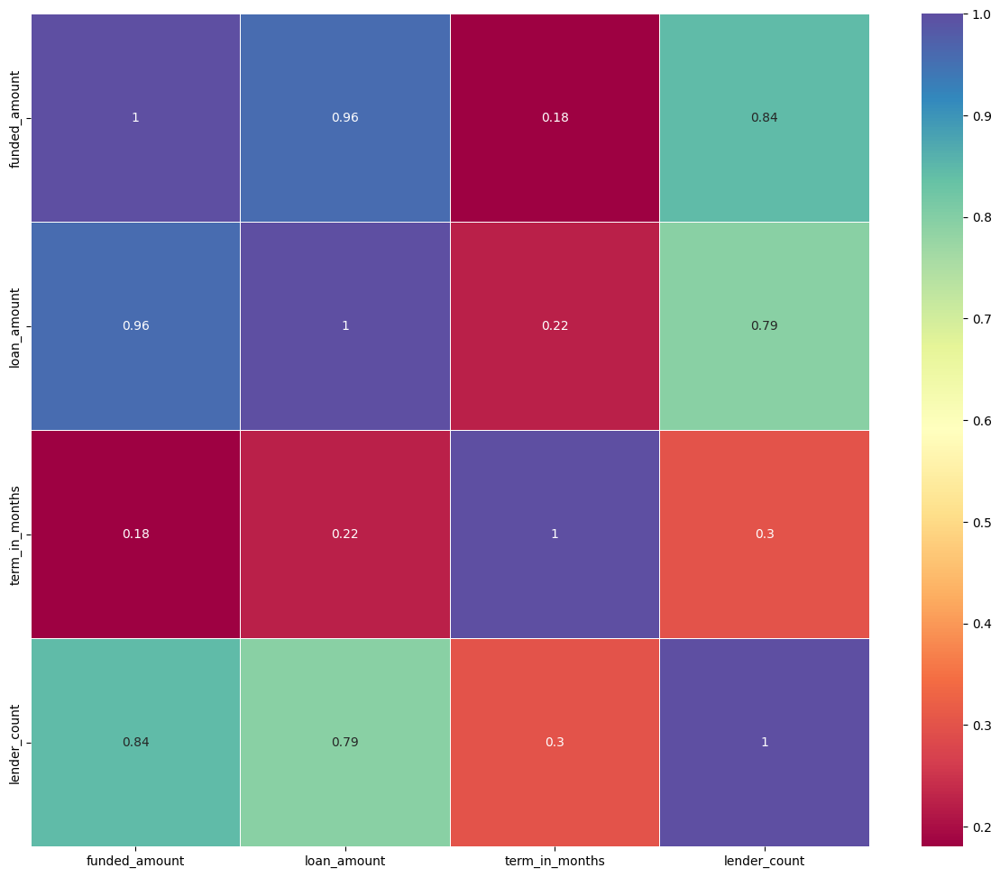

In [193]:

plt.figure(figsize=(15, 12))
#to show the corelation
sns.heatmap(data = Cleaned_df_final[numerical_columns].corr(), 
            cmap = "Spectral", annot = True, linewidths = 0.5)

In [194]:
Cleaned_df_final.shape

(33561, 106)

In [195]:
Cleaned_df_final['funded_amount'].isnull().sum()


0

# Data Preparation

In [196]:
X = Cleaned_df_final.drop(columns=['funded_amount','date','day','year','month'])  # Features (independent variables) , target
y = Cleaned_df_final['funded_amount']  # Target variable 

In [197]:
X.shape
y.shape

(33561,)

In [198]:
X.head()
y.head()

0    500.0
1    325.0
2    800.0
3    425.0
4    275.0
Name: funded_amount, dtype: float64

In [199]:
X.head()

,id,loan_amount,term_in_months,lender_count,repayment_interval,timestamp,Century,sector_Agriculture,sector_Arts,sector_Clothing,sector_Construction,sector_Education,sector_Entertainment,sector_Food,sector_Health,sector_Housing,sector_Manufacturing,sector_Personal Use,sector_Retail,sector_Services,sector_Transportation,sector_Wholesale,country_Albania,country_Armenia,country_Azerbaijan,country_Belize,country_Benin,country_Bolivia,country_Brazil,country_Burkina Faso,country_Burundi,country_Cambodia,country_Cameroon,country_Chile,country_China,country_Colombia,country_Congo,country_Costa Rica,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Georgia,country_Ghana,country_Guatemala,country_Haiti,country_Honduras,country_India,country_Indonesia,country_Iraq,country_Israel,country_Jordan,country_Kenya,country_Kosovo,country_Kyrgyzstan,country_Lao People's Democratic Republic,country_Lebanon,country_Lesotho,country_Liberia,country_Madagascar,country_Malawi,country_Mali,country_Mexico,country_Moldova,country_Mongolia,country_Mozambique,country_Myanmar (Burma),country_Nepal,country_Nicaragua,country_Nigeria,country_Pakistan,country_Palestine,country_Panama,country_Paraguay,country_Peru,country_Philippines,country_Puerto Rico,country_Rwanda,country_Saint Vincent and the Grenadines,country_Samoa,country_Senegal,country_Sierra Leone,country_Solomon Islands,country_Somalia,country_South Africa,country_South Sudan,country_Suriname,country_Tajikistan,country_Tanzania,country_Thailand,country_The Democratic Republic of the Congo,country_Timor-Leste,country_Togo,country_Turkey,country_Uganda,country_Ukraine,country_United States,country_Vietnam,country_Yemen,country_Zambia,country_Zimbabwe
0,1242201,500.0,14.0,14.0,2,1487548800,2017,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,1165778,325.0,14.0,13.0,1,1476144000,2016,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,1123052,800.0,14.0,29.0,0,1469404800,2016,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,1312344,425.0,8.0,1.0,1,1496361600,2017,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fa

# Train-Test Split

In [200]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [201]:
X_train.shape
X_test.shape
y_train.shape
y_test.shape


(6713,)

In [202]:
X_train.head(5)

,id,loan_amount,term_in_months,lender_count,repayment_interval,timestamp,Century,sector_Agriculture,sector_Arts,sector_Clothing,sector_Construction,sector_Education,sector_Entertainment,sector_Food,sector_Health,sector_Housing,sector_Manufacturing,sector_Personal Use,sector_Retail,sector_Services,sector_Transportation,sector_Wholesale,country_Albania,country_Armenia,country_Azerbaijan,country_Belize,country_Benin,country_Bolivia,country_Brazil,country_Burkina Faso,country_Burundi,country_Cambodia,country_Cameroon,country_Chile,country_China,country_Colombia,country_Congo,country_Costa Rica,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Georgia,country_Ghana,country_Guatemala,country_Haiti,country_Honduras,country_India,country_Indonesia,country_Iraq,country_Israel,country_Jordan,country_Kenya,country_Kosovo,country_Kyrgyzstan,country_Lao People's Democratic Republic,country_Lebanon,country_Lesotho,country_Liberia,country_Madagascar,country_Malawi,country_Mali,country_Mexico,country_Moldova,country_Mongolia,country_Mozambique,country_Myanmar (Burma),country_Nepal,country_Nicaragua,country_Nigeria,country_Pakistan,country_Palestine,country_Panama,country_Paraguay,country_Peru,country_Philippines,country_Puerto Rico,country_Rwanda,country_Saint Vincent and the Grenadines,country_Samoa,country_Senegal,country_Sierra Leone,country_Solomon Islands,country_Somalia,country_South Africa,country_South Sudan,country_Suriname,country_Tajikistan,country_Tanzania,country_Thailand,country_The Democratic Republic of the Congo,country_Timor-Leste,country_Togo,country_Turkey,country_Uganda,country_Ukraine,country_United States,country_Vietnam,country_Yemen,country_Zambia,country_Zimbabwe
31497,882857,350.0,20.0,7.0,0,1431302400,2015,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
4484,843891,650.0,14.0,18.0,2,1424390400,2015,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
31035,1236714,225.0,7.0,1.0,1,1486944000,2017,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
31382,1195271,300.0,14.0,8.0,2,1480377600,2016,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,Fals

In [203]:
X_train.info()
X_test.info()
y_test.info()
y_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26848 entries, 31497 to 15795
Columns: 101 entries, id to country_Zimbabwe
dtypes: bool(94), float64(3), int32(2), int64(2)
memory usage: 3.8 MB
<class 'pandas.core.frame.DataFrame'>
Index: 6713 entries, 573 to 12784
Columns: 101 entries, id to country_Zimbabwe
dtypes: bool(94), float64(3), int32(2), int64(2)
memory usage: 983.3 KB
<class 'pandas.core.series.Series'>
Index: 6713 entries, 573 to 12784
Series name: funded_amount
Non-Null Count  Dtype  
--------------  -----  
6713 non-null   float64
dtypes: float64(1)
memory usage: 104.9 KB
<class 'pandas.core.series.Series'>
Index: 26848 entries, 31497 to 15795
Series name: funded_amount
Non-Null Count  Dtype  
--------------  -----  
26848 non-null  float64
dtypes: float64(1)
memory usage: 419.5 KB


In [204]:
y_train


31497     350.0
4484      650.0
31035     225.0
31382     300.0
6095      975.0
6517      250.0
5501      375.0
13477     675.0
29183    1475.0
9509      475.0
14381     500.0
3482      175.0
15139     350.0
29400     450.0
9614      250.0
22120     675.0
16937    2725.0
5554      825.0
33403     225.0
32257     675.0
752       625.0
28793    2725.0
20993     200.0
10779    2225.0
14782    1050.0
14486     475.0
5821      300.0
16213    1175.0
3548     2625.0
22546     350.0
4788     2725.0
7456      225.0
24329     325.0
26066     350.0
30187    2725.0
1147     2000.0
26921     275.0
10830     925.0
33261     300.0
22974    1175.0
12590     975.0
13581     450.0
15176     925.0
31906     550.0
1474     2725.0
24957     250.0
20646     225.0
14076     650.0
21476    1650.0
3995      450.0
23633    2725.0
17405     500.0
3746      225.0
13078    1100.0
28169     125.0
10809    2725.0
32391    1000.0
14224    2725.0
19848     525.0
10944     600.0
26615     400.0
6672      400.0
9233    

# Model Training &  Evaluation

*#* Random Forest regressor

In [205]:
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_regressor.fit(X_train, y_train)

# Predict loan amounts on the test AND train set

rf_train_pred = rf_regressor.predict(X_train)
rf_test_pred = rf_regressor.predict(X_test)

# Evaluate the model

rf_train_mae = mean_absolute_error(y_train, rf_train_pred)
rf_train_mse = mean_squared_error(y_train, rf_train_pred)
rf_train_rmse = mean_squared_error(y_train, rf_train_pred, squared=False) #RMSE
rf_train_r2 = r2_score(y_train, rf_train_pred)  

rf_test_mae = mean_absolute_error(y_test, rf_test_pred)
rf_test_mse = mean_squared_error(y_test, rf_test_pred)
rf_test_rmse = mean_squared_error(y_test, rf_test_pred, squared=False)
rf_test_r2 = r2_score(y_test, rf_test_pred)

# Print evaluation metrics for Random Forest Regressor
print("Random Forest Regressor Metrics:")
print("Training Set:")
print(f"MAE: {rf_train_mae}")
print(f"MSE: {rf_train_mse}")
print(f"RMSE: {rf_train_rmse}")
print(f"R2 Score: {rf_train_r2}")

print("\nTesting Set:")
print(f"MAE: {rf_test_mae}")
print(f"MSE: {rf_test_mse}")
print(f"RMSE: {rf_test_rmse}")
print(f"R2 Score: {rf_test_r2}")



Random Forest Regressor Metrics:
Training Set:
MAE: 10.179814138855782
MSE: 1632.193797396454
RMSE: 40.40041828244423
R2 Score: 0.9963273196331288

Testing Set:
MAE: 26.956695963056752
MSE: 10019.951645315063
RMSE: 100.09970851763288
R2 Score: 0.9781062015784779


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [206]:
!pip install xgboost

*#* xgb_model

In [207]:


# Instantiate the XGBoost model
xgb_model = XGBRegressor()

# Train the model
xgb_model.fit(X_train, y_train)



# Predict loan amounts on the test AND train set

xgb_train_pred = xgb_model.predict(X_train)
xgb_test_pred = xgb_model.predict(X_test)


# Evaluate the model
xgb_train_mae = mean_absolute_error(y_train, xgb_train_pred)
xgb_train_mse = mean_squared_error(y_train, xgb_train_pred)
xgb_train_rmse = mean_squared_error(y_train, xgb_train_pred, squared=False)
xgb_train_r2 = r2_score(y_train, xgb_train_pred)

xgb_test_mae = mean_absolute_error(y_test, xgb_test_pred)
xgb_test_mse = mean_squared_error(y_test, xgb_test_pred)
xgb_test_rmse = mean_squared_error(y_test, xgb_test_pred, squared=False)
xgb_test_r2 = r2_score(y_test, xgb_test_pred)

# Print evaluation metrics for XGBoost Regressor
print("XGBoost Regressor Metrics:")
print("Training Set:")
print(f"MAE: {xgb_train_mae}")
print(f"MSE: {xgb_train_mse}")
print(f"RMSE: {xgb_train_rmse}")
print(f"R2 Score: {xgb_train_r2}")

print("\nTesting Set:")
print(f"MAE: {xgb_test_mae}")
print(f"MSE: {xgb_test_mse}")
print(f"RMSE: {xgb_test_rmse}")
print(f"R2 Score: {xgb_test_r2}")


XGBoost Regressor Metrics:
Training Set:
MAE: 22.379680958812937
MSE: 3268.140474775647
RMSE: 57.16765234619703
R2 Score: 0.9926461947245288

Testing Set:
MAE: 33.293119632556724
MSE: 9617.195230014318
RMSE: 98.06729949383902
R2 Score: 0.9789862325488561


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


*#* Support Vector Regressor

In [208]:

# Support Vector Regressor
svr_model = SVR()
svr_model.fit(X_train, y_train)
# Support Vector Regressor
svr_train_pred = svr_model.predict(X_train)
svr_test_pred = svr_model.predict(X_test)

svr_train_mae = mean_absolute_error(y_train, svr_train_pred)
svr_train_mse = mean_squared_error(y_train, svr_train_pred)
svr_train_rmse = mean_squared_error(y_train, svr_train_pred, squared=False)
svr_train_r2 = r2_score(y_train, svr_train_pred)

svr_test_mae = mean_absolute_error(y_test, svr_test_pred)
svr_test_mse = mean_squared_error(y_test, svr_test_pred)
svr_test_rmse = mean_squared_error(y_test, svr_test_pred, squared=False)
svr_test_r2 = r2_score(y_test, svr_test_pred)

# Print evaluation metrics for Support Vector Regressor
print("Support Vector Regressor Metrics:")
print("Training Set:")
print(f"MAE: {svr_train_mae}")
print(f"MSE: {svr_train_mse}")
print(f"RMSE: {svr_train_rmse}")
print(f"R2 Score: {svr_train_r2}")

print("\nTesting Set:")
print(f"MAE: {svr_test_mae}")
print(f"MSE: {svr_test_mse}")
print(f"RMSE: {svr_test_rmse}")
print(f"R2 Score: {svr_test_r2}")

Support Vector Regressor Metrics:
Training Set:
MAE: 437.7955209490065
MSE: 505371.04334705224
RMSE: 710.8945374294644
R2 Score: -0.13716049641076333

Testing Set:
MAE: 441.3617886464909
MSE: 520369.01263708796
RMSE: 721.3660739437972
R2 Score: -0.1370168909756897


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(



*#* Linear Regression

In [209]:

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Linear Regression
lr_train_pred = lr_model.predict(X_train)
lr_test_pred = lr_model.predict(X_test)

lr_train_mae = mean_absolute_error(y_train, lr_train_pred)
lr_train_mse = mean_squared_error(y_train, lr_train_pred)
lr_train_rmse = mean_squared_error(y_train, lr_train_pred, squared=False)
lr_train_r2 = r2_score(y_train, lr_train_pred)

lr_test_mae = mean_absolute_error(y_test, lr_test_pred)
lr_test_mse = mean_squared_error(y_test, lr_test_pred)
lr_test_rmse = mean_squared_error(y_test, lr_test_pred, squared=False)
lr_test_r2 = r2_score(y_test, lr_test_pred)
# Print evaluation metrics for Linear Regression
print("\nLinear Regression Metrics:")
print("Training Set:")
print(f"MAE: {lr_train_mae}")
print(f"MSE: {lr_train_mse}")
print(f"RMSE: {lr_train_rmse}")
print(f"R2 Score: {lr_train_r2}")

print("\nTesting Set:")
print(f"MAE: {lr_test_mae}")
print(f"MSE: {lr_test_mse}")
print(f"RMSE: {lr_test_rmse}")
print(f"R2 Score: {lr_test_r2}")


Linear Regression Metrics:
Training Set:
MAE: 78.66683905221342
MSE: 24732.522292137655
RMSE: 157.26576961353558
R2 Score: 0.9443481226368892

Testing Set:
MAE: 81.02538132198762
MSE: 25793.157792949685
RMSE: 160.60248376955346
R2 Score: 0.943641424892765


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(



*#* Polynomial Regression

In [210]:
# Polynomial Regression
poly = PolynomialFeatures(degree=2, include_bias=False)
poly_feature = poly.fit_transform(X)  # Transform input features to higher degree

# Splitting data into train and test sets
x_train_poly, x_test_poly, y_train_poly, y_test_poly = train_test_split(poly_feature, y, test_size=0.3, random_state=0)

# Creating and fitting the polynomial regression model
rgrr = LinearRegression()
rgrr.fit(x_train_poly, y_train_poly)

# Predicting on test and train data
test_predict_poly = rgrr.predict(x_test_poly)
train_predict_poly = rgrr.predict(x_train_poly)

# Calculating evaluation metrics for polynomial regression
ploy_train_mae = mean_absolute_error(y_train_poly, train_predict_poly)
ploy_train_mse = mean_squared_error(y_train_poly, train_predict_poly)
ploy_train_rmse = mean_squared_error(y_train_poly, train_predict_poly, squared=False)
ploy_train_r2 = r2_score(y_train_poly, train_predict_poly)

ploy_test_mae = mean_absolute_error(y_test_poly, test_predict_poly)
ploy_test_mse = mean_squared_error(y_test_poly, test_predict_poly)
ploy_test_rmse = mean_squared_error(y_test_poly, test_predict_poly, squared=False)
ploy_test_r2 = r2_score(y_test_poly, test_predict_poly)

# Print evaluation metrics for Polynomial Regression
print("\nPolynomial Regression Metrics:")
print("Training Set:")
print(f"MAE: {ploy_train_mae}")
print(f"MSE: {ploy_train_mse}")
print(f"RMSE: {ploy_train_rmse}")
print(f"R2 Score: {ploy_train_r2}")

print("\nTesting Set:")
print(f"MAE: {ploy_test_mae}")
print(f"MSE: {ploy_test_mse}")
print(f"RMSE: {ploy_test_rmse}")
print(f"R2 Score: {ploy_test_r2}")



Polynomial Regression Metrics:
Training Set:
MAE: 132.26135279155497
MSE: 60650.16706850015
RMSE: 246.27254631505346
R2 Score: 0.8651168929216752

Testing Set:
MAE: 132.62212822786918
MSE: 60427.85940277433
RMSE: 245.82078716572025
R2 Score: 0.8629665492716758


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


*#* Decision Tree Regessor 

In [211]:
# Creating and fitting the Decision Tree Regressor model
DTR = DecisionTreeRegressor(max_depth=3)
DTR.fit(x_train_poly, y_train_poly)

# Predicting on test and train data
test_predict_poly_tree = DTR.predict(x_test_poly)
train_predict_poly_tree = DTR.predict(x_train_poly)

# Calculating evaluation metrics for polynomial regression with Decision Tree Regressor
ploy_train_mae = mean_absolute_error(y_train_poly, train_predict_poly_tree)
ploy_train_mse = mean_squared_error(y_train_poly, train_predict_poly_tree)
ploy_train_rmse = mean_squared_error(y_train_poly, train_predict_poly_tree, squared=False)
ploy_train_r2 = r2_score(y_train_poly, train_predict_poly_tree)

ploy_test_mae = mean_absolute_error(y_test_poly, test_predict_poly_tree)
ploy_test_mse = mean_squared_error(y_test_poly, test_predict_poly_tree)
ploy_test_rmse = mean_squared_error(y_test_poly, test_predict_poly_tree, squared=False)
ploy_test_r2 = r2_score(y_test_poly, test_predict_poly_tree)

# Print evaluation metrics for Polynomial Regression with Decision Tree Regressor
print("\nPolynomial Regression Metrics with Decision Tree Regressor:")
print("Training Set:")
print(f"MAE: {ploy_train_mae}")
print(f"MSE: {ploy_train_mse}")
print(f"RMSE: {ploy_train_rmse}")
print(f"R2 Score: {ploy_train_r2}")

print("\nTesting Set:")
print(f"MAE: {ploy_test_mae}")
print(f"MSE: {ploy_test_mse}")
print(f"RMSE: {ploy_test_rmse}")
print(f"R2 Score: {ploy_test_r2}")



Polynomial Regression Metrics with Decision Tree Regressor:
Training Set:
MAE: 109.30439757876898
MSE: 36193.36704458462
RMSE: 190.24554408601696
R2 Score: 0.9195076610904289

Testing Set:
MAE: 110.4121341406864
MSE: 39942.56731423537
RMSE: 199.85636670928292
R2 Score: 0.9094214508984121


C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\sondo\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


* Visualization to Evaluation Metrics Comparison

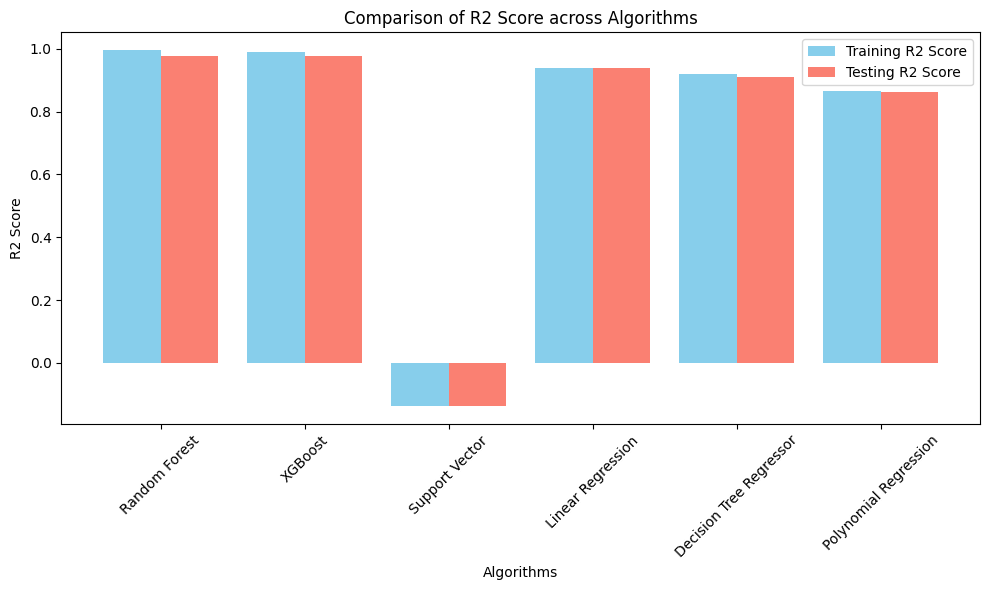

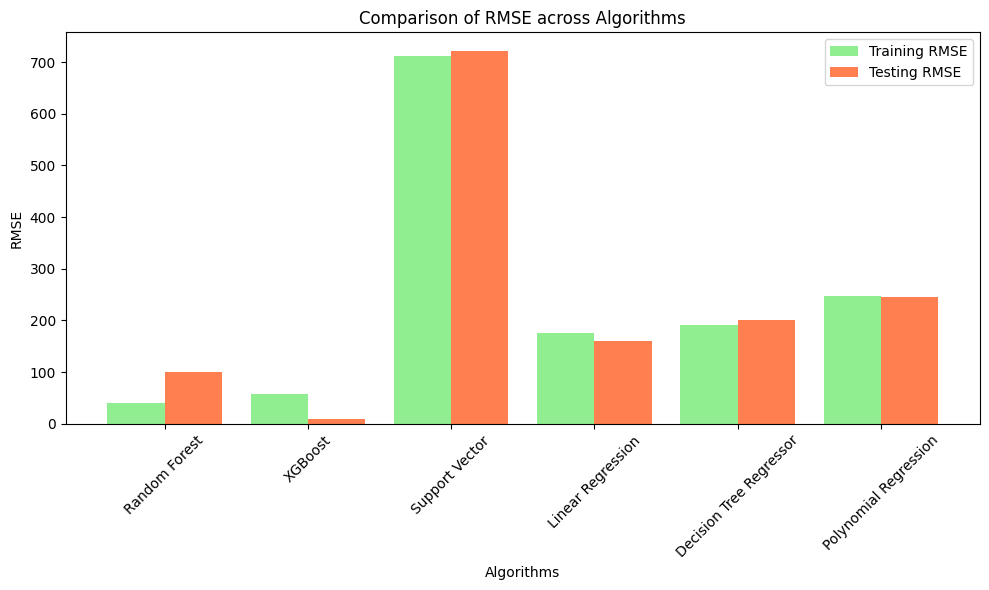

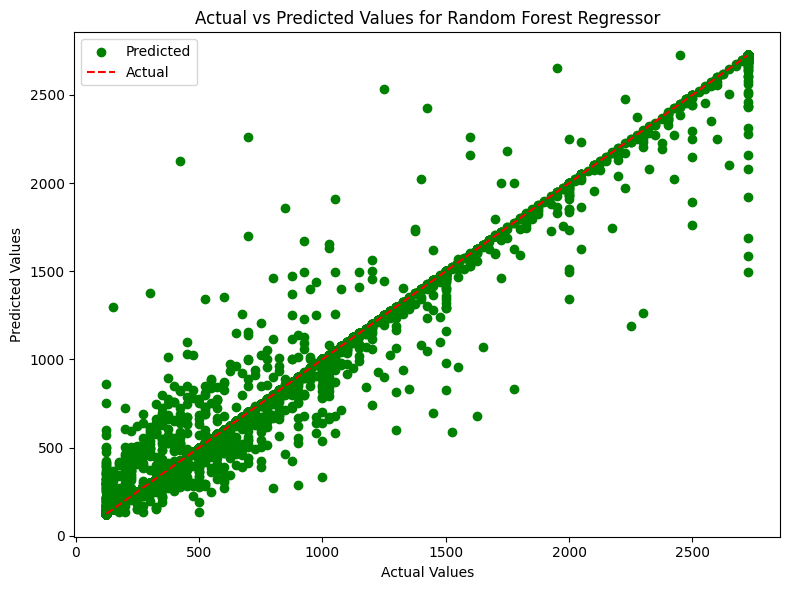

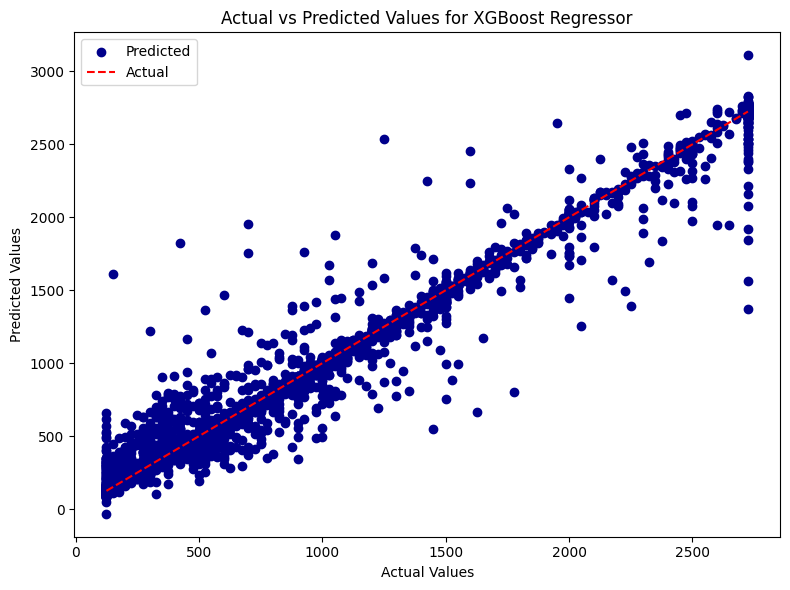

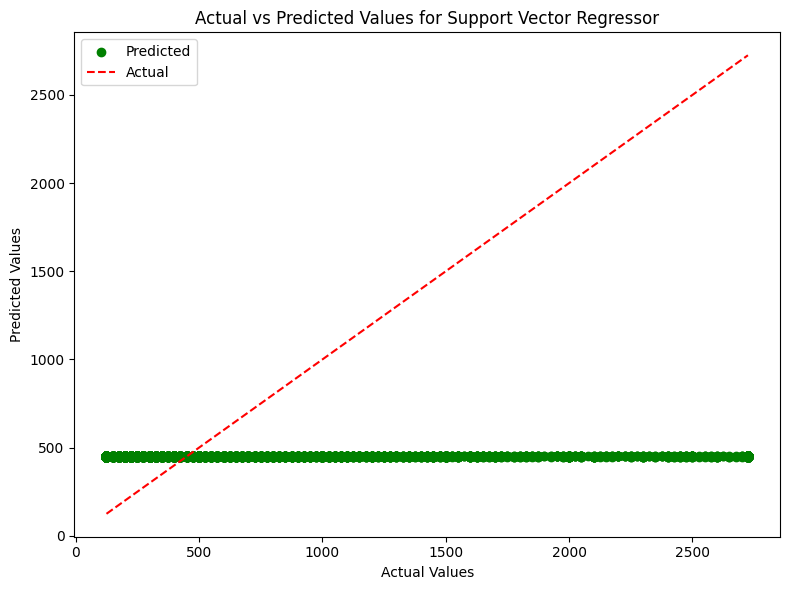

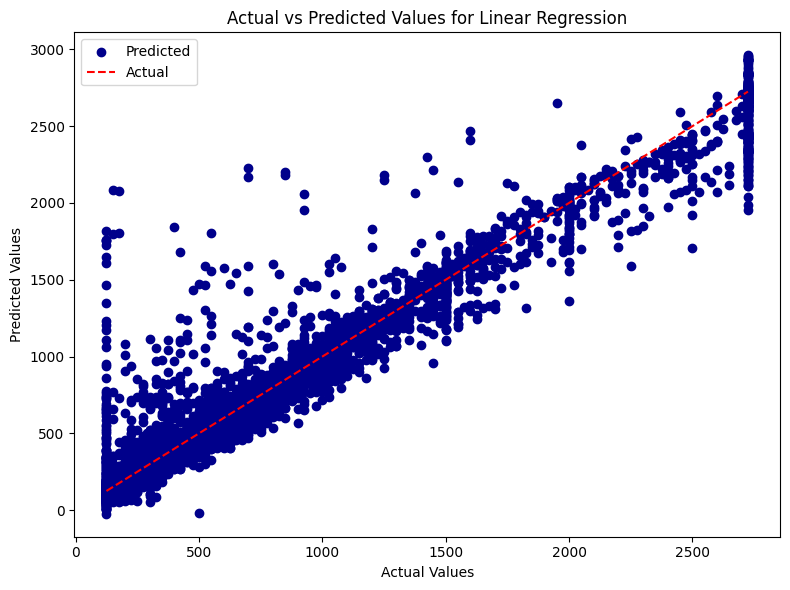

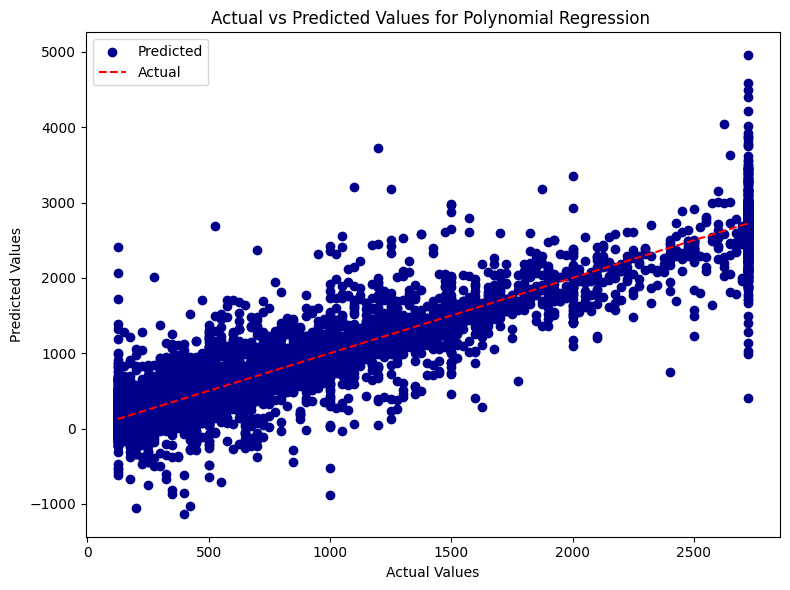

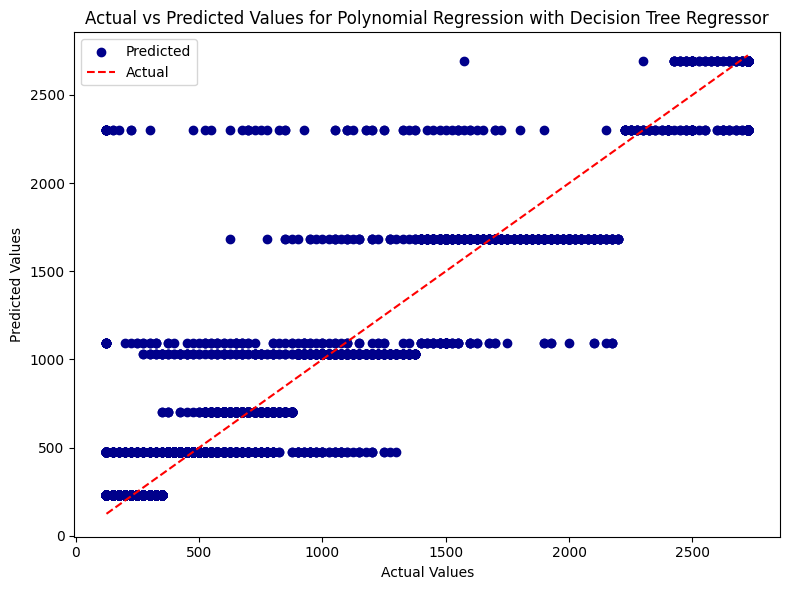

In [212]:


# Evaluation Metrics Comparison
labels = ['Random Forest', 'XGBoost', 'Support Vector', 'Linear Regression','Decision Tree Regressor','Polynomial Regression']
train_r2_scores = [0.996, 0.99, -0.137, 0.94,0.919, 0.865]
test_r2_scores = [0.978, 0.978,  -0.137, 0.94, 0.909, 0.8629]
train_rmse = [40.45, 57.167, 710.86, 175.265, 190.245,246.276]
test_rmse = [100.588, 8.567, 721.366, 160.6, 199.856, 245.824]

x = range(len(labels))

# Plotting R2 Score Comparison
plt.figure(figsize=(10, 6))
plt.bar(x, train_r2_scores, width=0.4, label='Training R2 Score', color='skyblue')
plt.bar([i + 0.4 for i in x], test_r2_scores, width=0.4, label='Testing R2 Score', color='salmon')
plt.xlabel('Algorithms')
plt.ylabel('R2 Score')
plt.title('Comparison of R2 Score across Algorithms')
plt.xticks([i + 0.2 for i in x], labels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Plotting RMSE Comparison
plt.figure(figsize=(10, 6))
plt.bar(x, train_rmse, width=0.4, label='Training RMSE', color='lightgreen')
plt.bar([i + 0.4 for i in x], test_rmse, width=0.4, label='Testing RMSE', color='coral')
plt.xlabel('Algorithms')
plt.ylabel('RMSE')
plt.title('Comparison of RMSE across Algorithms')
plt.xticks([i + 0.2 for i in x], labels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


# Scatter plot for Random Forest Regressor 
plt.figure(figsize=(8, 6))
plt.scatter(y_test, rf_test_pred, color='green', label='Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Random Forest Regressor')
plt.legend()
plt.tight_layout()
plt.show()

# Scatter plot for XGBoost Regressor 
plt.figure(figsize=(8, 6))
plt.scatter(y_test, xgb_test_pred, color='darkblue', label='Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for XGBoost Regressor')
plt.legend()
plt.tight_layout()
plt.show()

# Scatter plot for Support Vector Regressor 
plt.figure(figsize=(8, 6))
plt.scatter(y_test, svr_test_pred, color='green', label='Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Support Vector Regressor')
plt.legend()
plt.tight_layout()
plt.show()

# Scatter plot for Linear Regression 
plt.figure(figsize=(8, 6))
plt.scatter(y_test, lr_test_pred, color='darkblue', label='Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Linear Regression')
plt.legend()
plt.tight_layout()
plt.show()

# Scatter plot for Polynomial Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_test_poly, test_predict_poly, color='darkblue', label='Predicted')
plt.plot([min(y_test_poly), max(y_test_poly)], [min(y_test_poly), max(y_test_poly)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Polynomial Regression ')
plt.legend()
plt.tight_layout()
plt.show()

# Scatter plot for Decision Tree Regressor
plt.figure(figsize=(8, 6))
plt.scatter(y_test_poly, test_predict_poly_tree, color='darkblue', label='Predicted')
plt.plot([min(y_test_poly), max(y_test_poly)], [min(y_test_poly), max(y_test_poly)], color='red', linestyle='--', label='Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Polynomial Regression with Decision Tree Regressor')
plt.legend()
plt.tight_layout()
plt.show()




# Time Series Analysis


In [213]:
Cleaned_df_final.columns

Index(['id', 'funded_amount', 'loan_amount', 'term_in_months', 'lender_count',
       'repayment_interval', 'date', 'year', 'month', 'day',
       ...
       'country_Timor-Leste', 'country_Togo', 'country_Turkey',
       'country_Uganda', 'country_Ukraine', 'country_United States',
       'country_Vietnam', 'country_Yemen', 'country_Zambia',
       'country_Zimbabwe'],
      dtype='object', length=106)

* Step 1: Visualize the time series

In [214]:
# Assuming Cleaned_df_final is already defined
df_series = Cleaned_df_final[['funded_amount', 'date']]

# Convert 'date' to datetime
df_series['date'] = pd.to_datetime(df_series['date'])
# Set 'date' as index
df_series.set_index('date', inplace=True)

# Display the first few rows of the DataFrame
print(df_series.head())


            funded_amount
date                     
2017-02-20          500.0
2016-10-11          325.0
2016-07-25          800.0
2017-06-02          425.0
2015-03-25          275.0


C:\Users\sondo\AppData\Local\Temp\ipykernel_41960\3743821985.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_series['date'] = pd.to_datetime(df_series['date'])


In [215]:
df_series.isnull().sum()

funded_amount    0
dtype: int64

In [216]:
df_series.shape

(33561, 1)

In [217]:
df_series.describe()

,funded_amount
count,33561.000000
mean,699.069307
std,668.640368
min,125.000000
25%,250.000000
50%,450.000000
75%,900.000000
max,2725.000000


In [218]:
df_series=df_series.sort_index()


In [219]:
print(df_series.head())

            funded_amount
date                     
2014-01-01          250.0
2014-01-02         1225.0
2014-01-02          250.0
2014-01-02          325.0
2014-01-02         1200.0


In [220]:
df_series.shape

(33561, 1)

In [221]:
# Check for duplicated rows
df_series.duplicated().sum()

33451

In [222]:
df_series=df_series.groupby('date')['funded_amount'].sum().reset_index()

In [223]:
df_series.duplicated().sum()


0

In [224]:
df_series.shape

(1284, 2)

In [225]:
# Set 'date' as index again to perform slicing
df_series.set_index('date', inplace=True)


In [226]:
# Ensure the DataFrame is sorted by the index
df_series = df_series.sort_index()


In [227]:
df_series.head

<bound method NDFrame.head of             funded_amount
date                     
2014-01-01          250.0
2014-01-02        21375.0
2014-01-03        18625.0
2014-01-04         3450.0
2014-01-05         2575.0
2014-01-06        12000.0
2014-01-07        16200.0
2014-01-08        12125.0
2014-01-09        18200.0
2014-01-10         5175.0
2014-01-11          650.0
2014-01-12         1900.0
2014-01-13        11675.0
2014-01-14        26250.0
2014-01-15        23700.0
2014-01-16        17975.0
2014-01-17        24100.0
2014-01-18        10875.0
2014-01-19         4500.0
2014-01-20        23325.0
2014-01-21        30925.0
2014-01-22        22225.0
2014-01-23        21250.0
2014-01-24        16400.0
2014-01-25         1900.0
2014-01-26         3875.0
2014-01-27        30325.0
2014-01-28        18500.0
2014-01-29        20550.0
2014-01-30        17875.0
2014-01-31        16925.0
2014-02-01         2500.0
2014-02-02          725.0
2014-02-03        24375.0
2014-02-04        10225.0
2014-02-

In [228]:
# Define subsets for the original data
df_sub_1 = df_series.loc[:'2014-12-31']
df_sub_2 = df_series.loc['2015-01-01':'2015-12-31']
df_sub_3 = df_series.loc['2016-01-01':'2016-12-31']
df_sub_4 = df_series.loc['2017-01-01':'2017-12-31']


In [229]:
# Print the subsets to verify
print("Subset 1:")
print(df_sub_1.shape)
print("\nSubset 2:")
print(df_sub_2.shape)
print("\nSubset 3:")
print(df_sub_3.shape)
print("\nSubset 4:")
print(df_sub_4.shape)


Subset 1:
(363, 1)

Subset 2:
(364, 1)

Subset 3:
(363, 1)

Subset 4:
(194, 1)


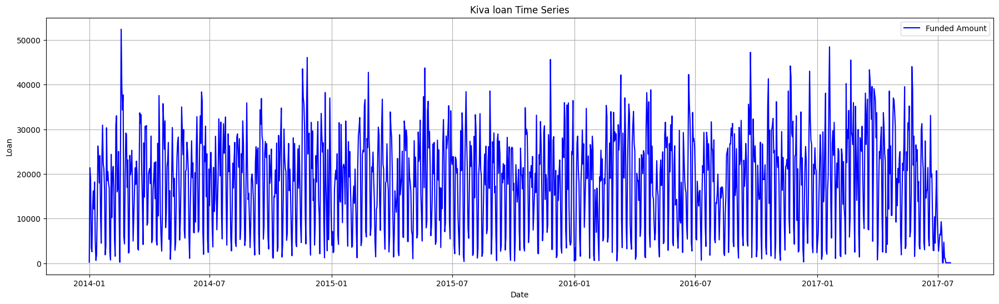

In [230]:
# Visualize the time series
plt.figure(figsize=(22, 6))
plt.plot(df_series.index, df_series['funded_amount'], label='Funded Amount', color='blue')
plt.title('Kiva loan Time Series')
plt.xlabel('Date')
plt.ylabel('Loan')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [231]:

def stationarize_series(series):
    # Calculate rolling statistics
    rolling_mean = series.rolling(window=12).mean()
    rolling_std = series.rolling(window=12).std()

    # Plot rolling statistics with thinner lines
    plt.figure(figsize=(20, 6))
    plt.plot(series, label='Original', color='blue', linewidth=1)  # Thin blue line for original series
    plt.plot(rolling_mean, label='Rolling Mean', color='red', linewidth=1)  # Thin red line for rolling mean
    plt.plot(rolling_std, label='Rolling Std', color='green', linewidth=1)  # Thin green line for rolling std
    plt.title('Rolling Mean & Standard Deviation')
    plt.xlabel('Date')
    plt.ylabel('Loan amount')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    


In [232]:
def P_Value_Calc(series):
# Perform Dickey-Fuller test
    result = adfuller(series)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

ADF Statistic: -5.879261344341694
p-value: 3.106174264523386e-07
Critical Values:
	1%: -3.4355381554821585
	5%: -2.8638311143598556
	10%: -2.567989813198476


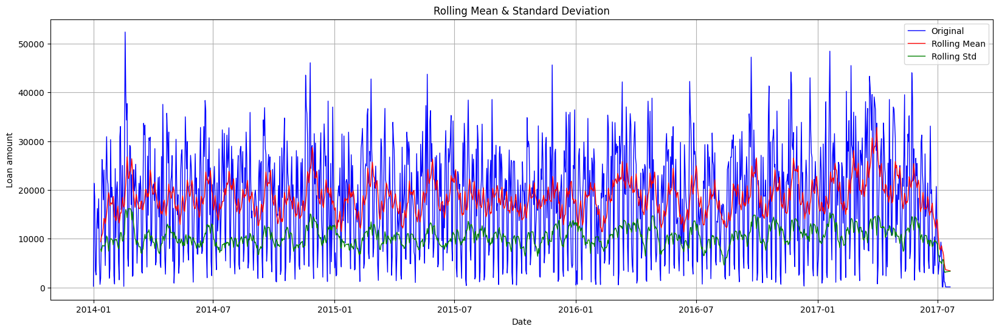

In [233]:
P_Value_Calc(df_series.funded_amount.dropna())
stationarize_series(df_series.funded_amount.dropna())

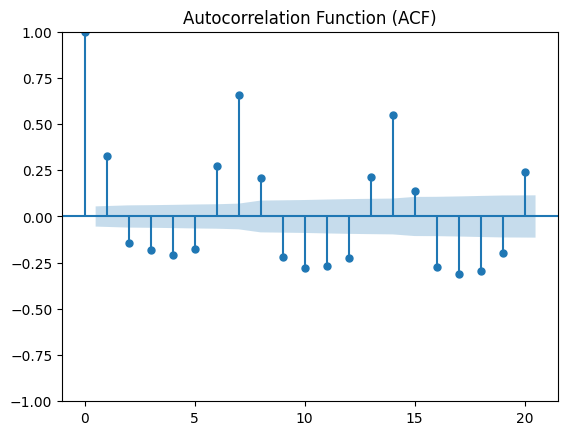

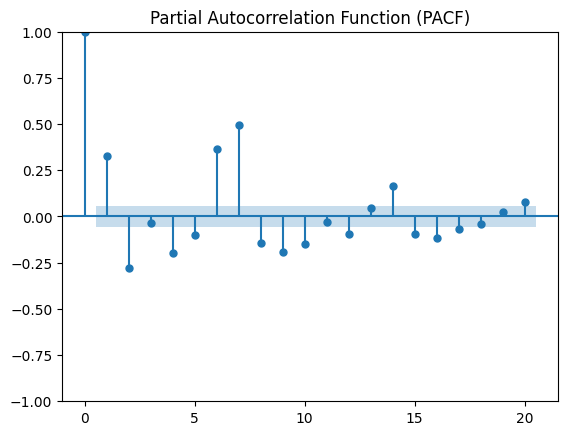

In [234]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Plot ACF
plot_acf(df_series['funded_amount'].dropna(), lags=20)
plt.title('Autocorrelation Function (ACF)')
plt.show()

# Plot PACF
plot_pacf(df_series['funded_amount'].dropna(), lags=20)
plt.title('Partial Autocorrelation Function (PACF)')
plt.show()


In [235]:
from statsmodels.tsa.arima.model import ARIMA
from itertools import product

# Define the range for p and q
p_values = range(1, 4)
d = 0  # Since we're working with stationary data, d=0
q_values = range(1, 4)

# Initialize variables to store best model parameters and corresponding AIC and BIC values
best_aic = float('inf')
best_bic = float('inf')
best_order = (0, 0, 0)

# Iterate over all possible combinations of p and q
for p, q in product(p_values, q_values):
    # Fit the ARIMA model
    model = ARIMA(df_series['funded_amount'], order=(p, d, q))
    arima_model = model.fit()
    
    # Get the AIC and BIC values
    aic = arima_model.aic
    bic = arima_model.bic
    
    # Compare with current best AIC and BIC values
    if aic < best_aic:
        best_aic = aic
        best_order = (p, d, q)
    
    if bic < best_bic:
        best_bic = bic

best_order

c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\stats

(3, 0, 3)

In [236]:
# Fit the best ARIMA model
best_arima_model = ARIMA(df_series['funded_amount'], order=((3,0,3))).fit()

# Print the summary of the best model
print(best_arima_model.summary())
# Predict
forecast = best_arima_model.predict()


c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Python312\Lib\site-packages\statsmo

                               SARIMAX Results                                
Dep. Variable:          funded_amount   No. Observations:                 1284
Model:                 ARIMA(3, 0, 3)   Log Likelihood              -13438.227
Date:                Sun, 19 May 2024   AIC                          26892.453
Time:                        11:34:15   BIC                          26933.715
Sample:                             0   HQIC                         26907.944
                               - 1284                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.827e+04    229.452     79.634      0.000    1.78e+04    1.87e+04
ar.L1          0.2652      0.008     31.581      0.000       0.249       0.282
ar.L2          0.2035      0.010     20.589      0.0

c:\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [237]:
forecast.shape

(1284,)

In [238]:
df_sub_1p = forecast.loc['2014-01-01':'2014-12-31']
df_sub_2p= forecast.loc['2015-01-01':'2015-12-31']
df_sub_3p= forecast.loc['2016-01-01':'2016-12-31']
df_sub_4p= forecast.loc['2017-01-01':'2017-12-31']

In [239]:
forecast.head()

date
2014-01-01    18272.169010
2014-01-02    14658.209238
2014-01-03    20899.365254
2014-01-04    22138.560582
2014-01-05    19050.445587
Name: predicted_mean, dtype: float64

In [240]:
def plot_forecast(original, forecast, title):
    plt.figure(figsize=(20, 6))
    plt.plot(original.index, original['funded_amount'], label='Original', color='blue', linewidth=1)
    plt.plot(forecast.index, forecast, label='Forecast', color='red', linewidth=1)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Loans')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

In [241]:
df_sub_1.shape


(363, 1)

In [242]:
df_sub_1p.shape


(363,)

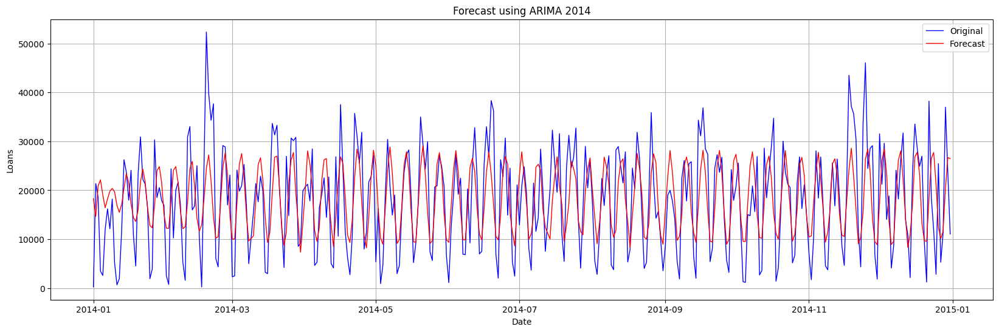

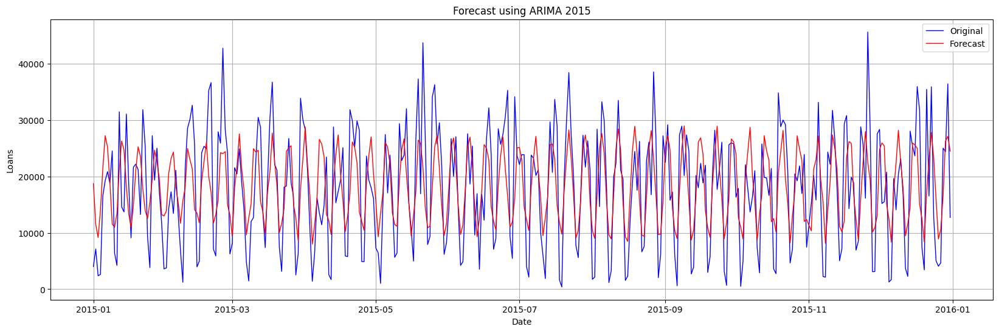

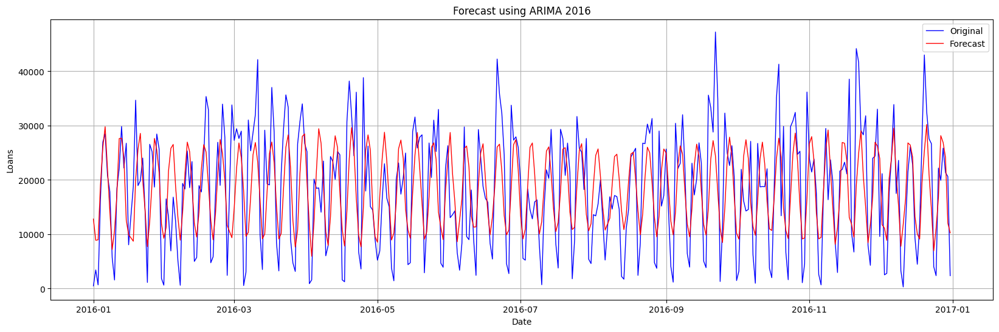

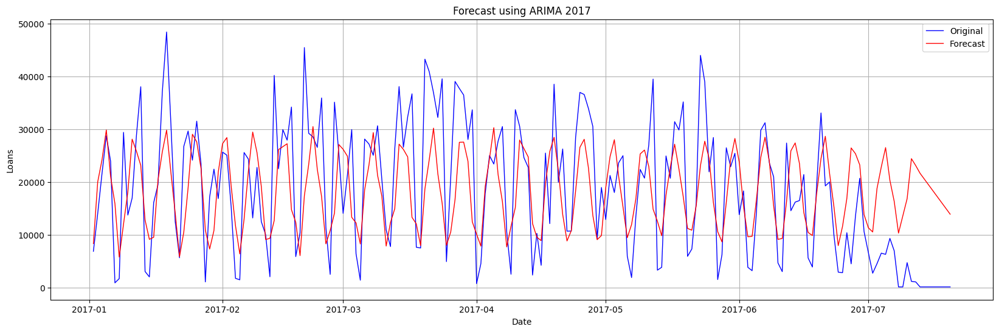

In [243]:
plot_forecast(df_sub_1, df_sub_1p, 'Forecast using ARIMA 2014')
plot_forecast(df_sub_2, df_sub_2p, 'Forecast using ARIMA 2015')
plot_forecast(df_sub_3, df_sub_3p, 'Forecast using ARIMA 2016')
plot_forecast(df_sub_4, df_sub_4p, 'Forecast using ARIMA 2017')

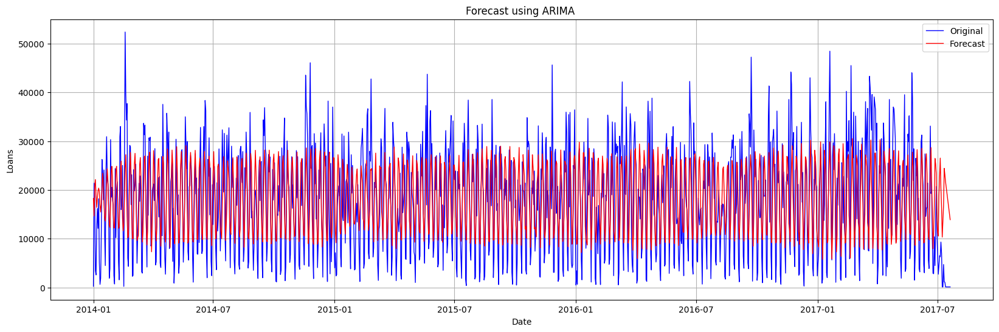

In [244]:
plot_forecast(df_series, forecast, 'Forecast using ARIMA ')


In [245]:
df_series.head()


,funded_amount
date,
2014-01-01,250.0
2014-01-02,21375.0
2014-01-03,18625.0
2014-01-04,3450.0
2014-01-05,2575.0


In [246]:
df_series.tail()

,funded_amount
date,
2017-07-10,4725.0
2017-07-11,1175.0
2017-07-12,1075.0
2017-07-13,125.0
2017-07-20,125.0


c:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


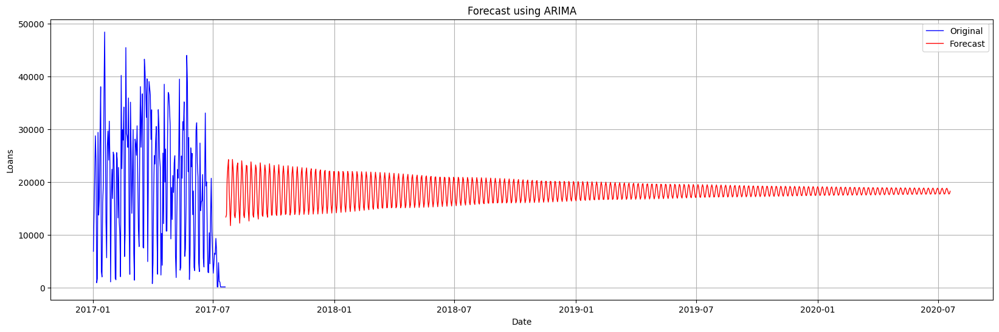

In [249]:
# Predict future values
forecast_steps = 365*3  # Predict for 3 year
forecast = best_arima_model.get_forecast(steps=forecast_steps)
# Extract the predicted mean values
forecast_series = forecast.predicted_mean
# Create a date range for the forecast
forecast_index = pd.date_range(start=df_series.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')
forecast_series.index = forecast_index
# Plot the forecasts with the original data
plot_forecast(df_sub_4, forecast_series, 'Forecast using ARIMA')